### The purpose of this script is to organize the multiple Jupyter notebooks (in Harmony.4) used to perform clustering and pseudotime analysis on BL41-42 with 10X libraries (samples 11 and 51), so that the code is clean and concise, organized and documented, and Github upload-ready. 

# 0 Loading packages <a name="loading"></a> 

In [1]:
import sys
print(sys.executable)
print(sys.path)
print(sys.version)

/home2/s418610/.conda/envs/py37_TOC_PAGA/bin/python
['/home2/s418610/jupyter_notebooks/Invivo_neuronal_reprogramming/Cluster_with_10x/Remapped_10X_data/Harmony.4', '', '/cm/shared/apps/cnvkit/0.9.5/lib/python3.6/site-packages', '/cm/shared/apps/python/3.6.4-anaconda/lib', '/cm/shared/apps/jupyterkernel-matlab/0.16.1/lib/python3.6/site-packages', '/cm/shared/apps/python/2.7.x-anaconda/lib', '/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python37.zip', '/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7', '/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/lib-dynload', '/home2/s418610/.local/lib/python3.7/site-packages', '/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages', '/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/fa2-0.3.5-py3.7-linux-x86_64.egg', '/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/IPython/extensions', '/home2/s418610/.ipython']
3.7.3 (default, Mar 27 2019, 22:11:17) 
[GCC 7.3.0]


In [2]:
import re
from pathlib import Path
import numpy as np
import pandas as pd
import scipy.sparse
import sklearn.manifold
import statsmodels.api as sm

# from sklearn.preprocessing import StandardScaler
# from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from pyclustering.cluster.kmedoids import kmedoids

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
# import seaborn as sb

import scanpy as sc
import harmonypy as hm

In [3]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
# plt.rcParams["axes.grid"] = False
sc.settings.verbosity = 3

# sc.set_figure_params(figsize=(8,8), fontsize=12)

print('numpy', np.__version__)
print('pandas', pd.__version__)
print('scipy', scipy.__version__)
print('sklearn', sklearn.__version__)
print('statsmodels', sm.__version__)
print('matplotlib', mpl.__version__)
print('seaborn', sns.__version__)

sc.logging.print_versions() # scanpy==1.4.5.post1, anndata==0.6.22.post1

!date +%F

numpy 1.17.2
pandas 0.25.2
scipy 1.3.1
sklearn 0.21.3
statsmodels 0.10.1
matplotlib 3.0.3
seaborn 0.9.0
scanpy==1.4.5.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1
2020-07-28


In [4]:
import os

# set a working directory for saving plots
wdir = "/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures/"
os.chdir( wdir )

In [5]:
# A sub-directory for saving intermediate data for organized pipeline v1
data_dir = '/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/Cluster_with_10X_20k/data/10x_remapped/PipelineOrganized_v1/'

In [6]:
neural_data_dir = data_dir + 'NeuralOnly/'

# 1 Load and label data

### 1.1 Load datasets

In [7]:
# Load BL41 and BL42 with 10X datasets (output file of cellranger count aggr)
adata = sc.read_10x_h5('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/BL41-42_with_10X/1.3M_brain_11_51/aggr_10x/outs/filtered_feature_bc_matrix.h5')

reading /project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/BL41-42_with_10X/1.3M_brain_11_51/aggr_10x/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:03)


In [8]:
adata.X

<33145x31055 sparse matrix of type '<class 'numpy.float32'>'
	with 63963631 stored elements in Compressed Sparse Row format>

In [8]:
# The combined dataset has 33145 cells, and 31055 genes
assert adata.X.shape == (33145, 31055)

### 1.2 Add library name and batch labels as columns in adata.obs

In [11]:
# Initalize 'library_name' and 'batch' columns with empty strings
adata.obs['library_name'] = [''] * adata.X.shape[0]
adata.obs['batch'] = [''] * adata.X.shape[0]

Trying to set attribute `.obs` of view, making a copy.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [12]:
# If cell index ends with '1', it's from library BL41, and therefore will be labeled 'BL41_reprogarmmed'; so on and so forth
# Cells from BL41 and BL42 are labeled as batch 'experiment', while cells the public 10X 1.3M brain cell dataset are labeled '10X"
for cell_index in adata.obs.index:
    if cell_index.split('-')[-1] == '1':
        adata.obs['library_name'][cell_index] = 'BL41_reprogrammed'
        adata.obs['batch'][cell_index] = 'experiment'
    elif cell_index.split('-')[-1] == '2':
        adata.obs['library_name'][cell_index] = 'BL42_control'
        adata.obs['batch'][cell_index] = 'experiment'
    elif cell_index.split('-')[-1] == '3':
        adata.obs['library_name'][cell_index] = '10X_sample11'
        adata.obs['batch'][cell_index] = '10X'
    else: 
        adata.obs['library_name'][cell_index] = '10X_sample51'
        adata.obs['batch'][cell_index] = '10X'

In [16]:
# BL41 has 6452 cells, BL42 has 5075 cells
adata.obs['library_name'].value_counts()

10X_sample11         11127
10X_sample51         10491
BL41_reprogrammed     6452
BL42_control          5075
Name: library_name, dtype: int64

### 1.3 Add lentivirus and tdTomato expression levels as columns in adata.obs

##### Due to the relatively low sequencing depth of the 10X public data, when running `cell ranger aggr`, BL41 and BL42 (esp. the latter) are greatly down-sampled. This have resulted in an even sparser readout of lenti and tdT (they are already sparse since a large fraction of the reads land in WPRE and polyA signal, which is the same between lenti and tdT loci, and these reads are therefore removed from analysis). 
##### Thus, here I try to incoporate an earlier version of the dataset when BL41 and BL42 were not aggregated with 10X libraries, but with each other

In [17]:
adata_tmp = sc.read_10x_h5('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/BL41-42_Lenti-Dlx2_tdTomato/aggr/aggr_10x/outs/filtered_feature_bc_matrix.h5')

reading /project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/BL41-42_Lenti-Dlx2_tdTomato/aggr/aggr_10x/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


In [18]:
# Aggregated BL41-42 dataset has 11527 cells and 31055 genes
assert adata_tmp.X.shape == (11527, 31055)

In [20]:
# Assert that the last two genes are lenti and tdTomato, respectively
assert np.all(adata_tmp[:,-2:].var.index == ['Lenti-hGfa-Dlx2-IRES-GFP', 'tdTomato-WPRE-bGHpA'])

In [21]:
# Initiate 'lenti_count' column with value 0
adata.obs['lenti_count'] = [0] * adata.X.shape[0]

In [22]:
# Get all cell indeces from BL41 and BL42
experiment_index = adata.obs.index[adata.obs['batch'] == 'experiment']

In [23]:
# Assert that there are 11527 cell indeces for batch 'experiment' (i.e. BL41 and BL42)
assert len(experiment_index) == 11527

In [24]:
adata.obs['lenti_count'][experiment_index] = adata_tmp[experiment_index,:][:,-2].X
adata.obs['lenti_log1p_count'] = np.log1p(adata.obs['lenti_count'])
# adata.obs['lenti_log1p_count'] = np.log2(adata.obs['lenti_count']+1)

/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()
/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [25]:
# Initiate 'tdT_count' column with value 0
adata.obs['tdT_count'] = [0] * adata.X.shape[0]

In [26]:
adata.obs['tdT_count'][experiment_index] = adata_tmp[experiment_index,:][:,-1].X
adata.obs['tdT_log1p_count'] = np.log1p(adata.obs['tdT_count'])
# adata.obs['tdT_log1p_count'] = np.log2(adata.obs['tdT_count']+1)

/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [27]:
adata.obs.head(10)

,library_name,batch,lenti_count,lenti_log1p_count,tdT_count,tdT_log1p_count
AAACCCAAGAACGCGT-1,BL41_reprogrammed,experiment,0.0,0.000000,1.0,0.693147
AAACCCAAGACTACGG-1,BL41_reprogrammed,experiment,0.0,0.000000,1.0,0.693147
AAACCCACACAGGATG-1,BL41_reprogrammed,experiment,3.0,1.386294,4.0,1.609438
AAACCCAGTTGGTGTT-1,BL41_reprogrammed,experiment,0.0,0.000000,6.0,1.945910
AAACCCATCCCACAGG-1,BL41_reprogrammed,experiment,1.0,0.693147,1.0,0.693147
AAACCCATCTGCTCTG-1,BL41_reprogrammed,experiment,0.0,0.000000,2.0,1.098612
AAACGAAGTCGCGGTT-1,BL41_reprogrammed,experiment,0.0,0.000000,0.0,0.000000
AAACGAAGTGGAGAAA-1,BL41_reprogrammed,experiment,0.0,0.000000,0.0,0.000000
AAACGCTCATTAGGAA-1,BL41_reprogrammed,experiment,17.0,2.890372,12.0,2.564949
AAACGCTGTAGACAAT-1,BL41_reprogrammed,experiment,2.0,1.098612,4.0,1.609438


# 2 Preprocessing

### 2.1 Quality control: filter out low-quality cells and low-expression genes

In [28]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

mt_gene_mask = [gene.startswith('mt-') for gene in adata.var_names]
adata.obs['mt_count'] = adata[:, mt_gene_mask].X.sum(1)
adata.obs['mt_frac'] = adata.obs['mt_count']/adata.obs['n_counts']

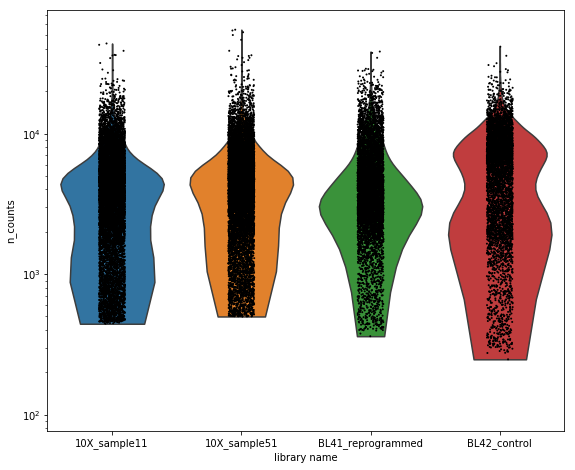

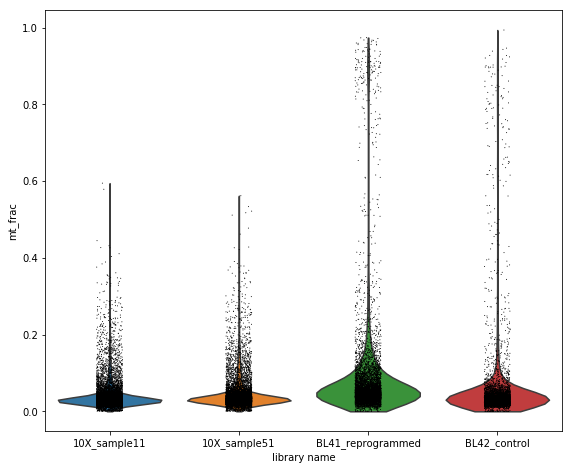

In [30]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata, 'n_counts', groupby='library_name', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata, 'mt_frac', groupby='library_name')

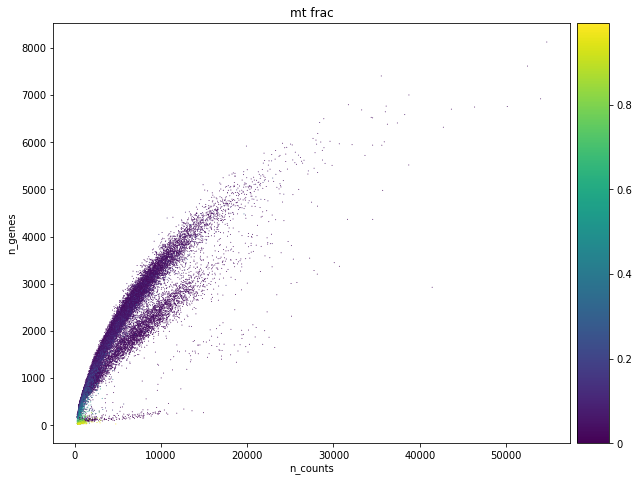

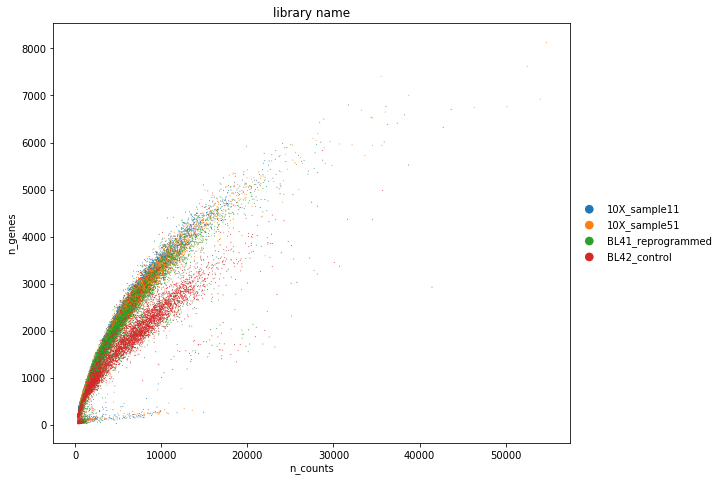

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


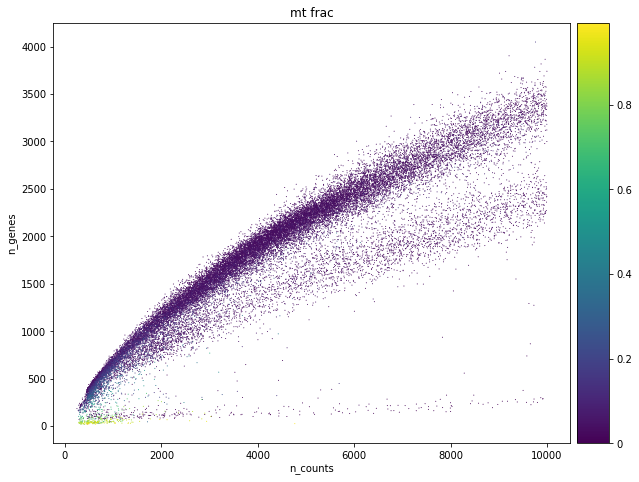

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


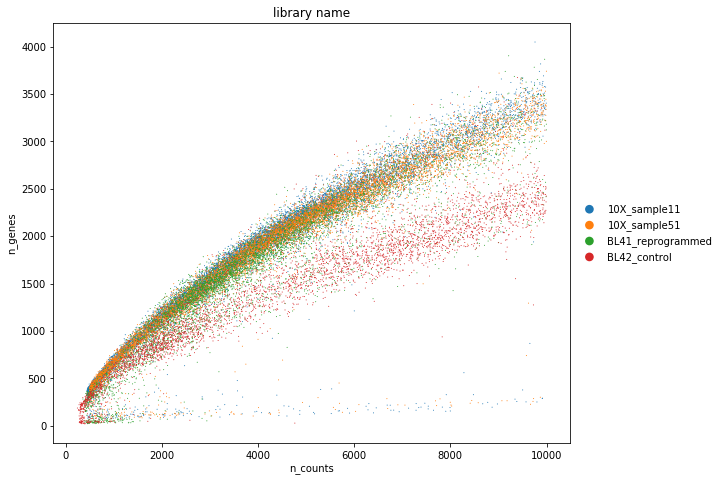

In [31]:
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='mt_frac')
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='library_name')
#p1 = sc.pl.scatter(adata[adata.obs['mt_frac']>0.4], 'n_counts', 'n_genes', color='library_name')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='library_name')

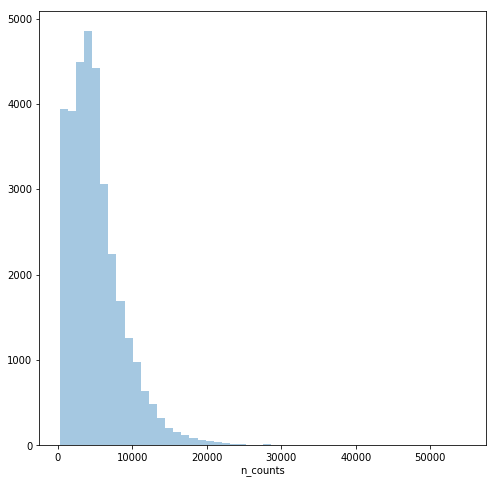

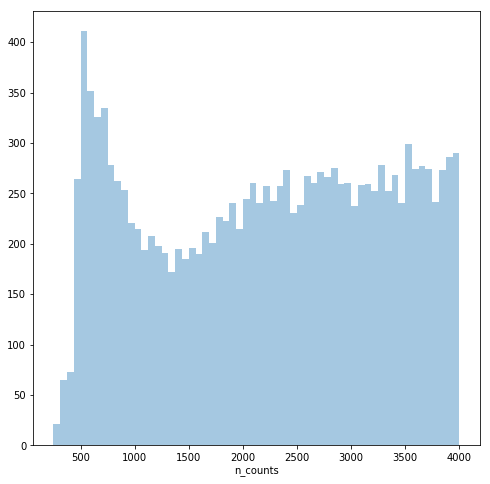

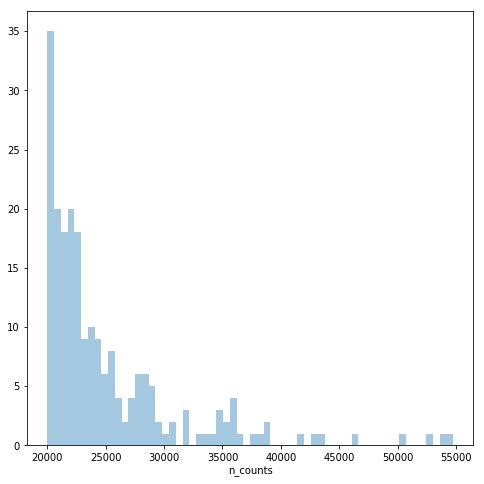

In [32]:
#Thresholding decision: counts
p3 = sns.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']<4000], kde=False, bins=60)
plt.show()

p5 = sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [33]:
# Visual cutoffs for counts: >500 and <40,000

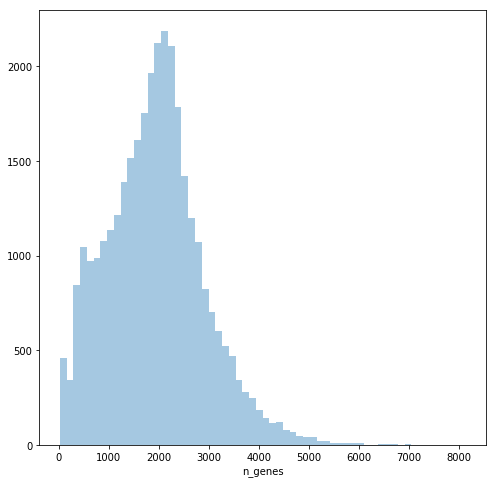

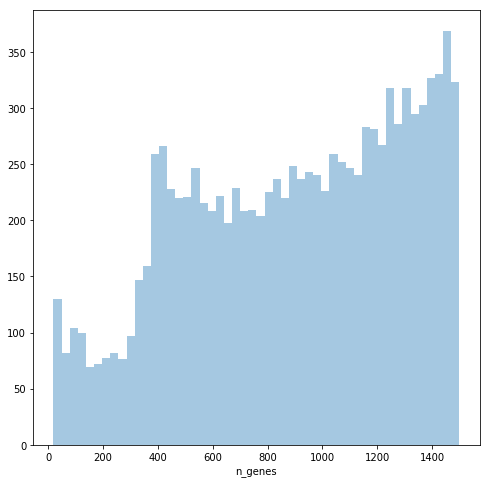

In [34]:
#Thresholding decision: genes
p6 = sns.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sns.distplot(adata.obs['n_genes'][adata.obs['n_genes']<1500], kde=False, bins=50)
plt.show()

In [35]:
# Visual cutoff for genes >300

In [36]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 500)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 40000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.5]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 300)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

Total number of cells: 33145
filtered out 427 cells that have less than 500 counts


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min count filter: 32718
filtered out 8 cells that have more than 40000 counts


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 32710
Number of cells after MT filter: 32482
filtered out 372 cells that have less than 300 genes expressed


Trying to set attribute `.obs` of view, making a copy.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after gene filter: 32110


In [37]:
genes_positivecells = (adata.X.toarray() > 0).T.sum(axis=1)

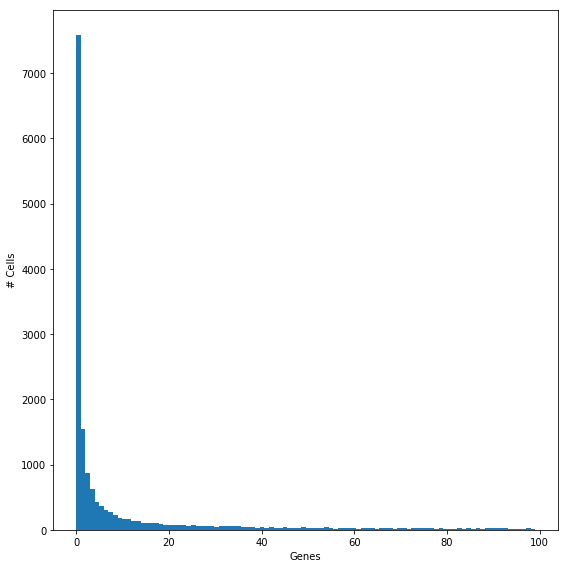

In [39]:
num_bins = 100

fig, ax = plt.subplots()

# the histogram of the data
n, bins, patches = ax.hist(genes_positivecells[genes_positivecells<100], num_bins, density=0)

ax.set_xlabel('Genes')
ax.set_ylabel('# Cells')

fig.tight_layout()
plt.show()

In [40]:
# Based on the plot above, I choose the cutoff to be 5 cells
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 5 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=5)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 31055
filtered out 11051 genes that are detected in less than 5 cells


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of genes after cell filter: 20004


In [41]:
# 32110 cells and 20004 genes passed filtering
assert adata.X.shape == (32110, 20004)

In [42]:
adata.write(data_dir + 'POv2_BL41-42_10X-samples11_51_postFiltering.h5ad')

### 2.2 Log transform read count matrix, and save it in adata.raw
#### Also, save the read count matrix in adata.layers beforehand

In [43]:
adata = sc.read(data_dir + 'POv2_BL41-42_10X-samples11_51_postFiltering.h5ad')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [44]:
adata

AnnData object with n_obs × n_vars = 32110 × 20004 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'library_name_colors'

In [45]:
#Keep the count data in a counts layer
adata.layers['counts'] = adata.X.copy()

In [46]:
# Natural log-transform the data
sc.pp.log1p(adata)

In [47]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

In [48]:
adata.write(data_dir + 'PO_v2_BL41-42_10X-samples11_51_postFiltering_log.h5ad')

# 3 Batch correction with Harmony

In [49]:
adata = sc.read(data_dir + 'PO_v2_BL41-42_10X-samples11_51_postFiltering_log.h5ad')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [50]:
adata

AnnData object with n_obs × n_vars = 32110 × 20004 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'library_name_colors'
    layers: 'counts'

### 3.1 Calculating and keep top 2500 Highly Variable Genes (HVGs) with scanpy

In [51]:
n_genes = 2500

sc.pp.recipe_zheng17(adata, n_top_genes = 2500, log=False) # log=False as adata.X is already log-transformed

running recipe zheng17


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
normalizing counts per cell
    finished (0:00:00)
    finished (0:00:04)


In [52]:
# Only 2499 HVGs left
assert adata.X.shape == (32110, 2499)

### 3.2 Performing PCA with scanpy

In [53]:
sc.tl.pca(adata, n_comps=50)

computing PCA with n_comps = 50
    finished (0:00:01)


In [54]:
adata

AnnData object with n_obs × n_vars = 32110 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

### 3.3 Running Harmony

Note: Harmony needs PCs as input. 

In [55]:
# Make sure data dimensonality is good
assert adata.X.shape == (32110, 2499)
assert adata.obsm['X_pca'].shape == (32110, 50)

In [56]:
meta_data = adata.obs # adata.obs can be used directly as metadata
vars_use = ['batch', 'library_name'] # Multi-variate correction: first correct between batch, 
                                     # then correct within batch between libraries
data_mat = adata.obsm['X_pca'] # Initial data is PCA output

In [57]:
ho = hm.run_harmony(data_mat, meta_data, vars_use, max_iter_kmeans=50) # Run Harmony till convergence

2020-07-22 18:42:46,194 - harmonypy - INFO - Iteration 1 of 50
2020-07-22 18:43:01,444 - harmonypy - INFO - Iteration 2 of 50
2020-07-22 18:43:07,845 - harmonypy - INFO - Iteration 3 of 50
2020-07-22 18:43:18,440 - harmonypy - INFO - Iteration 4 of 50
2020-07-22 18:43:33,451 - harmonypy - INFO - Converged after 4 iterations


In [58]:
# ho.Z_corr holds the corrected matrix, but transposed
assert ho.Z_corr.shape == (50, 32110)

In [59]:
adata.obsm['Harmony'] = ho.Z_corr.T

In [60]:
adata

AnnData object with n_obs × n_vars = 32110 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'pca'
    obsm: 'X_pca', 'Harmony'
    varm: 'PCs'
    layers: 'counts'

In [61]:
adata.obsm['Harmony']

array([[-2.262281  , 16.509436  ,  1.4512156 , ..., -0.6888126 ,
        -0.30343205,  2.0362036 ],
       [10.50891   , -6.1154447 , 12.793444  , ..., -1.6519469 ,
         0.68983245,  1.1922557 ],
       [-4.3409815 , -0.4992277 ,  0.63019955, ...,  0.17646414,
         1.0927628 , -0.360766  ],
       ...,
       [ 5.766733  , -5.534202  ,  9.158675  , ..., -0.48692295,
         0.83848786, -0.5689916 ],
       [-1.8832422 , 14.6217    ,  0.28801143, ...,  0.92599016,
        -1.5310543 , -1.7368029 ],
       [13.002648  ,  9.441381  ,  7.8859096 , ..., -0.33010837,
         0.5640654 ,  0.522513  ]], dtype=float32)

In [62]:
adata.write(data_dir + 'POv2_BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony.h5ad')

# 4 Clustering and cell typing

In [63]:
adata = sc.read(data_dir + 'POv2_BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony.h5ad')

### 4.1 Louvain clustering and single-cell embedding with PAGA

computing neighbors


/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostic

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:11)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 25 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:04)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:02)
--> added 'pos', the PAGA positions (adata.uns['paga'])


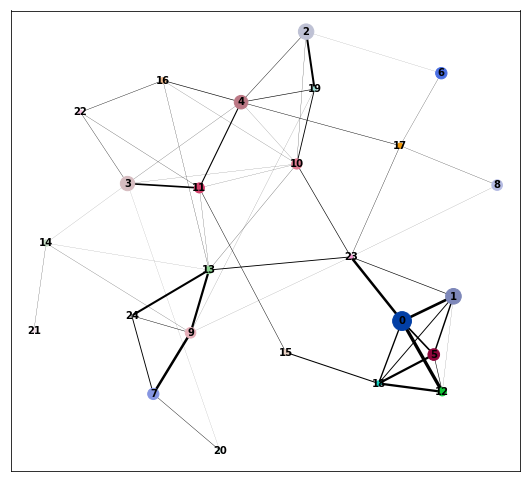

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:35)


In [64]:
sc.pp.neighbors(
    adata,
    use_rep='Harmony',  
#    random_state=random_seed 
)

sc.tl.louvain(
    adata,
    resolution=0.50,
#    random_state=random_seed
)

sc.tl.paga(
    adata,
    groups='louvain', 
)

sc.pl.paga(
    adata, 
    color=['louvain'], 
    use_raw=True,
    layout='fr',
    threshold=0.01,
    node_size_scale=0.5,
    node_size_power=0.9, 
#    random_state=random_seed,
)

sc.tl.umap(
    adata,
    init_pos='paga',
#    random_state=random_seed,
)

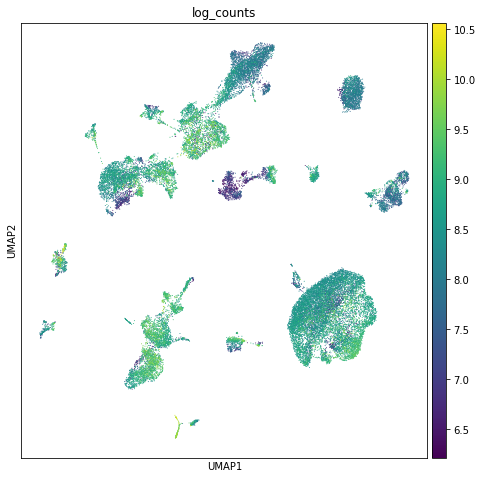

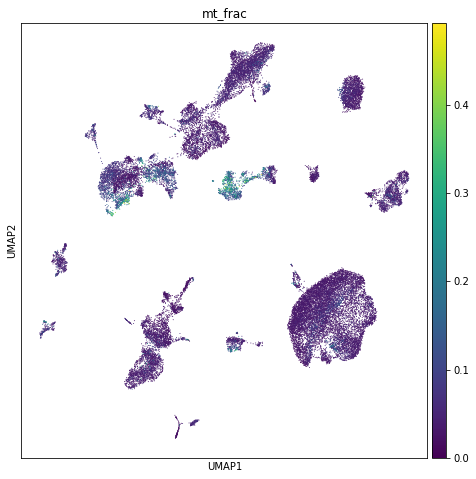

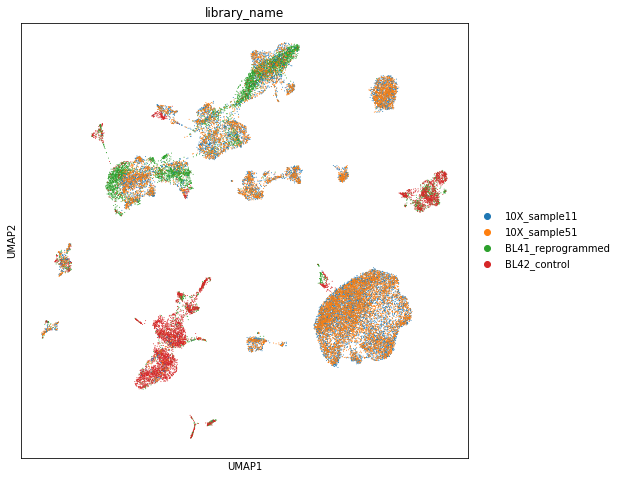

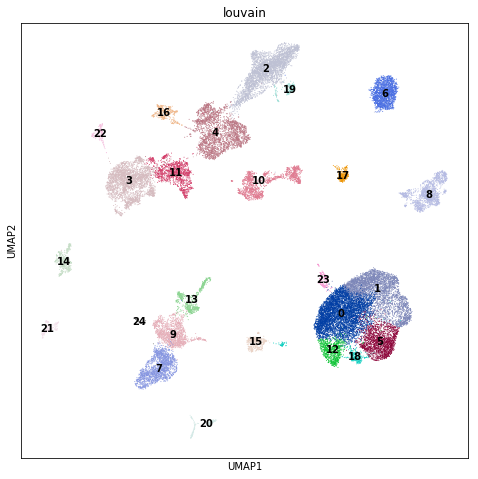

In [65]:
# Visualize sequencing depth, library distribution, and Louvain clusters
sc.pl.umap(adata, color='log_counts')
sc.pl.umap(adata, color='mt_frac')
sc.pl.umap(adata, color='library_name')
sc.pl.umap(adata, color='louvain', legend_loc='on data', )

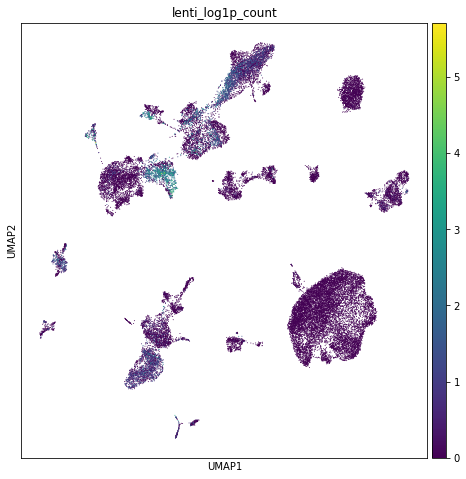

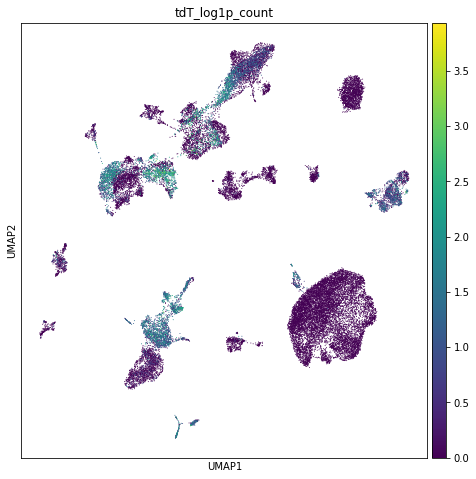

In [66]:
# Visualize lentivirus and tdT expression levels
sc.pl.umap(adata, color='lenti_log1p_count')
sc.pl.umap(adata, color='tdT_log1p_count')

In [67]:
adata.write(data_dir + 'POv2_BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony_PAGA_louvain.h5ad')

### 4.2 Coarse cell typing

In [7]:
adata = sc.read(data_dir + 'POv2_BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony_PAGA_louvain.h5ad')

#### Reference: 
Brain cell typing: Cell types in the mouse cortex and hippocampus revealed by single-cell RNA-seq (Zeisel et al. 2015), and A single-cell atlas of mouse brain macrophages reveals unique transcriptional identities shaped by ontogeny and tissue environment (Van Hove et al. 2019)


M1 and M2 macrophages: Different distributions of M1 and M2 macrophages in a mouse model of laser-induced choroidal neovascularization (Zhou et al. 2017)

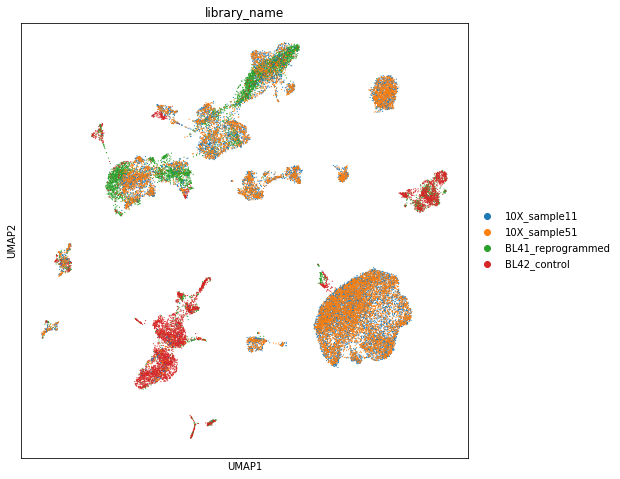

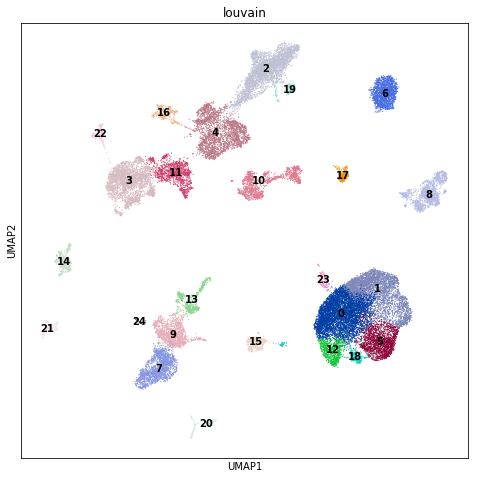

In [8]:
sc.pl.umap(adata, color='library_name', size=5, 
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

sc.pl.umap(adata, color='louvain', size=5, legend_loc='on data' , 
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### 4.2.1 Endothelial cells = cluster 14

Vwf is an endothelial marker gene, which umambiguously marks cluster 14

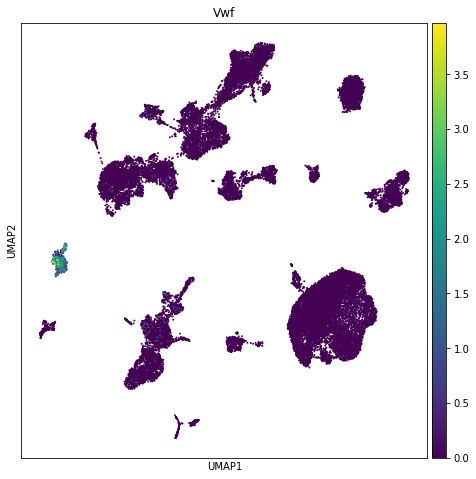

In [9]:
# Cluster 15 = Endothelial cells
sc.pl.umap(adata, color=['Vwf'], size=15, legend_loc='on data', use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### 4.2.2 Microglial cells = cluster 7

Microglial cells are 'C1qa' and 'Sparc' double-positive. 

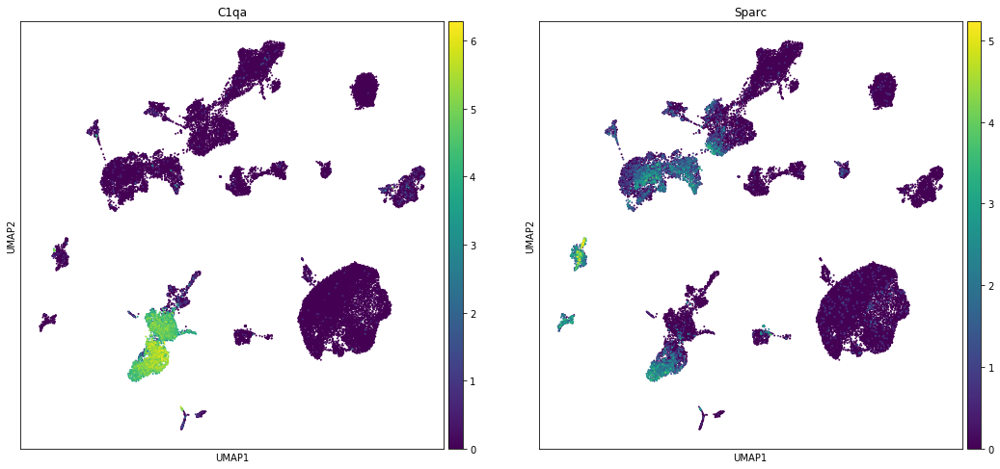

In [9]:
# Cluster 8 = Microglia
sc.pl.umap(adata, color=['C1qa', 'Sparc'], size=15, legend_loc='on data', use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### 4.2.3 Myeloid cells

#### Macrophages = cluster 9

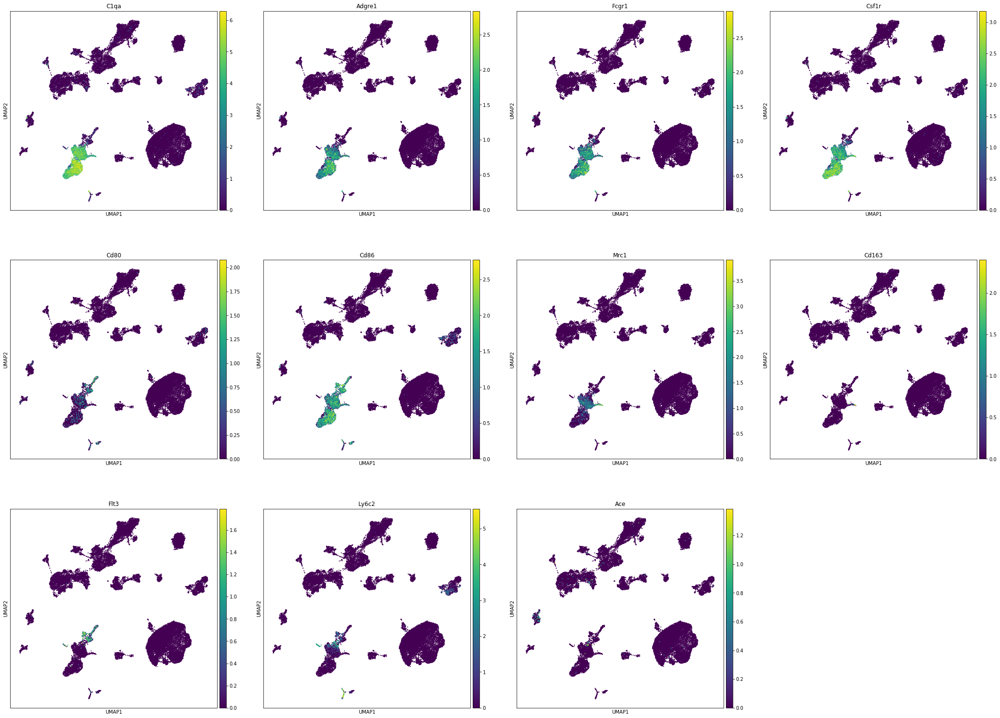

In [10]:
# Cluster 9 = Macrophages, with M1 and M2 subtypes
sc.pl.umap(adata, color=['C1qa', 'Adgre1', 'Fcgr1', 'Csf1r',  # Pan-macrophage markers
                         'Cd80', 'Cd86', # M1 macrophage markers
                         'Mrc1', 'Cd163', # M2 macrophage markers
                        'Flt3', 'Ly6c2', 'Ace'], # should be negative
           size=15, legend_loc='on data', use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### Monocyte-derived Cells = cluster 13

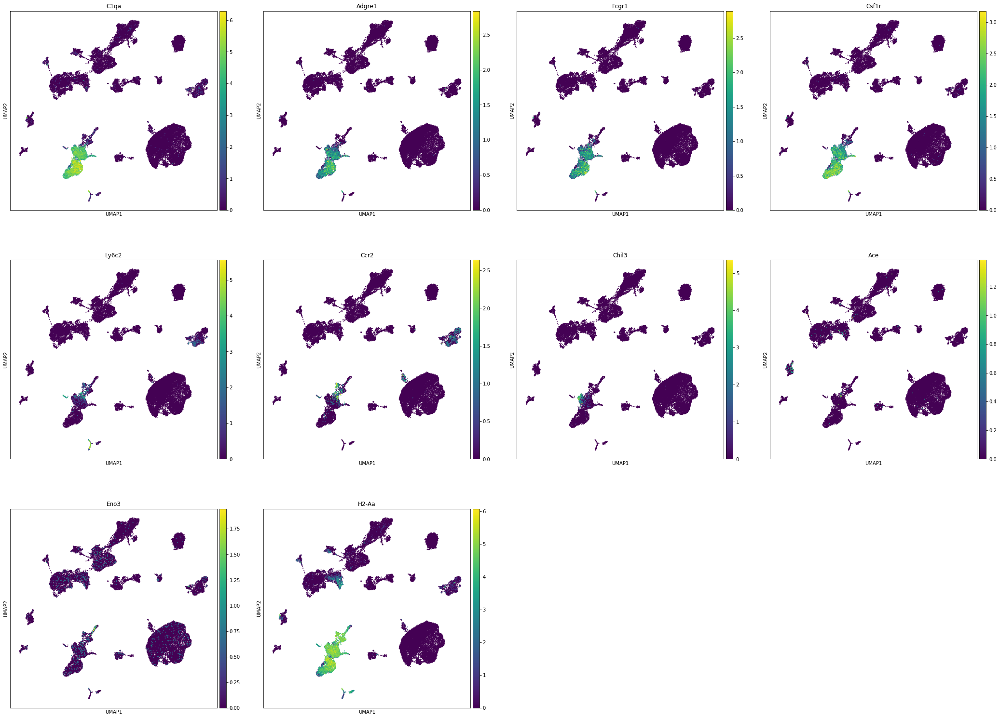

In [12]:
# Monocyte-derived cells (MdC): C1qa lo, Adgre1 int, Fcgr1 int, Csf1r int, Ly6c2hi, Ccr2 hi, Chil3-, Ace-, Eno3-, H2-Aa+
sc.pl.umap(adata, color=['C1qa', # lo
                         'Adgre1', 'Fcgr1', 'Csf1r',  # int
                         'Ly6c2', 'Ccr2', # hi
                         'Chil3', 'Ace', 'Eno3', # neg
                        'H2-Aa'], # pos
           size=15, legend_loc='on data', use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### Dendritic cell = clusters 13, 24

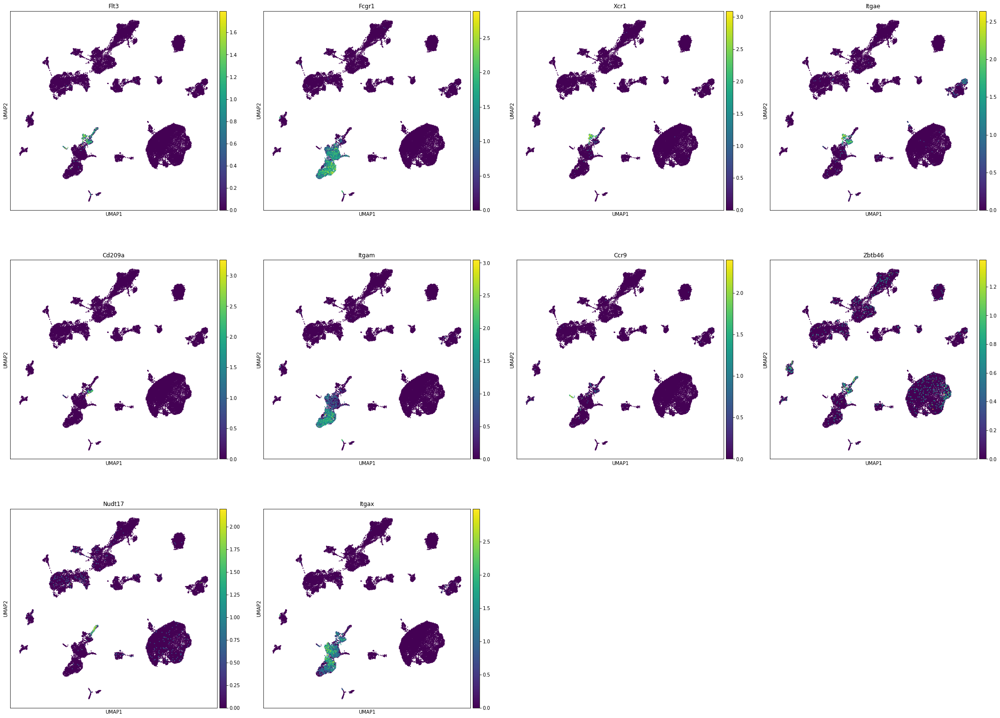

In [14]:
# Dendritic cells have 4 subtypes: conventional dendritic cells-1 and -2 (cDC1 and cDC2), plasmacytoid 
#                                  dendritic cells (pDC), and migratory dendritic cell (migratory DC)
sc.pl.umap(adata, color=[
                        'Flt3', # pos for all DC
                        'Fcgr1', # neg for all DC
                        'Xcr1', 'Itgae', # positive for cDC1
                        'Cd209a', 'Itgam', # positive for cDC2
                        'Ccr9',  # positive for pDC
                        'Zbtb46', #neg for pDC
                        'Nudt17', # Positive for Migratory DC
                        'Itgax', # pos for all but migratory
                         ],
           size=15, legend_loc='on data', use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )
# Conclusions: It seems cluster 24 is pDC, and cluster 13 contains all of the other 3 subtypes of DC. 
# This overlaps with MdC. Interesting. 

Didn't find: classical and non-classical monocytes.

#### 4.2.4 Lymphoid cells

#### T cells = clusters 8, 23

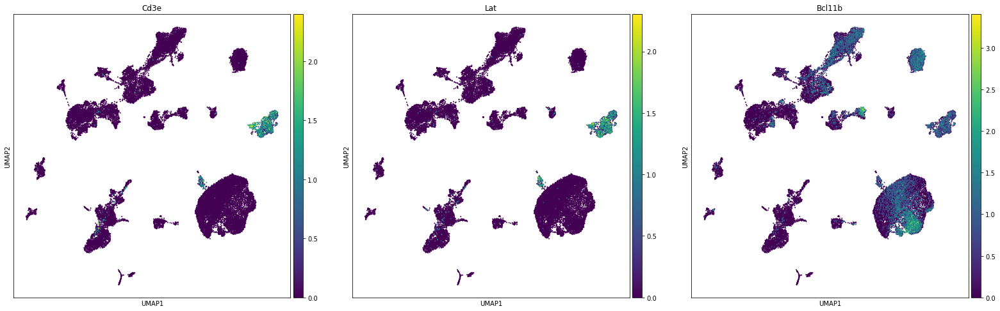

In [15]:
# T cells: Cd3e+, Lat+, Bcl11b+

sc.pl.umap(adata, color=['Cd3e', 
                         'Lat', 'Bcl11b'], size=15, legend_loc='on data', use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### Innate lymphoid cells = tip of cluster 23

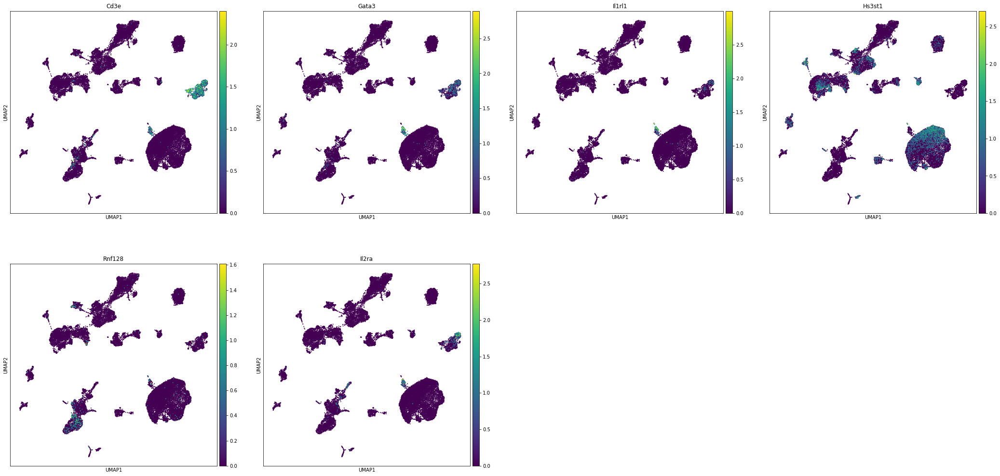

In [17]:
# Innate lymphoid cells: Cd3e-, Gata3hi, Il1rl1+, Hs3st1+, Rnf128+, Il2ra+
sc.pl.umap(adata, color=['Cd3e', 
                         'Gata3', 'Il1rl1', 'Hs3st1', 'Rnf128', 'Il2ra'], size=15, legend_loc='on data', use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### B cells = cluster 20 

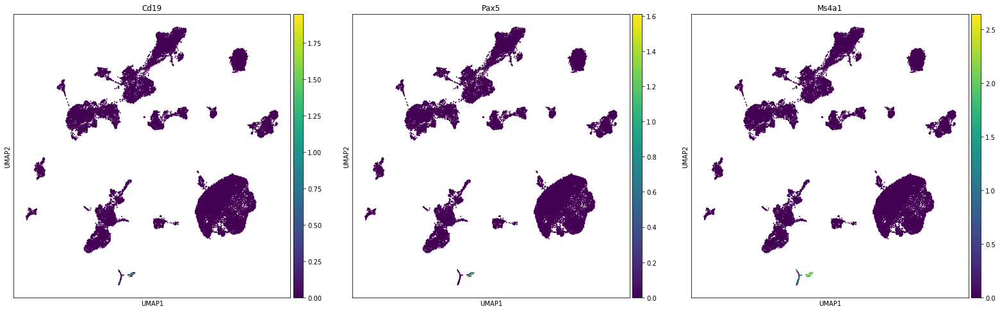

In [77]:
# B cells: Cd19+, Pax5+, Ms4a1+

sc.pl.umap(adata, color=['Cd19', 'Pax5', 'Ms4a1'], size=15, legend_loc='on data', use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

# B cells = Cluster 16, and maybe 15? 
# Cluster 16 is enriched in B cell genes, while cluster 15 is enriched in protein secretion pathways, predominantly ER-related

#### 4.2.5 Mural cells = cluster 21 

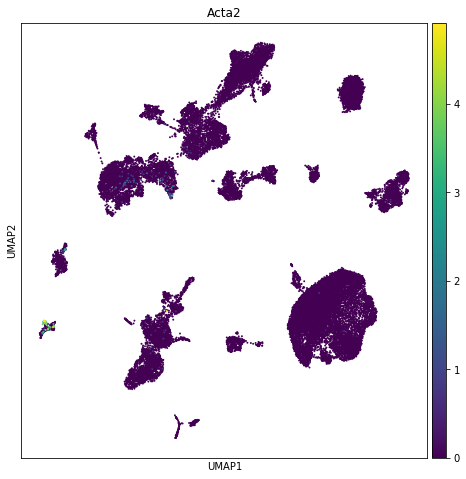

In [18]:
sc.pl.umap(adata, color=['Acta2'], size=15, legend_loc='on data', use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

It seems that clusters 0, 1, 2, 3, 4, 5, 6, 8, 10, 11, 12, 15, 16, 17, 18, 22 are all neural cells
19????, 

#### 4.2.6 Erothyroblasts = part of cluster 19? 

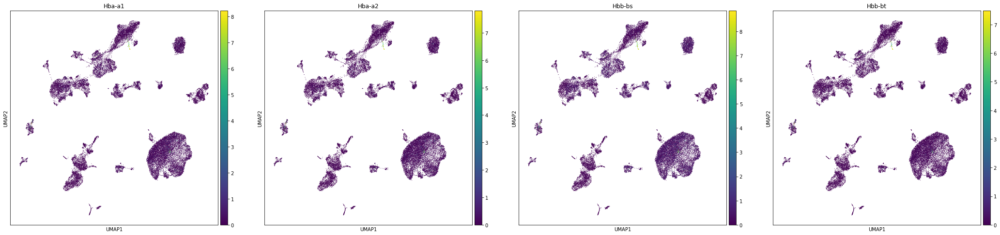

In [7]:
sc.pl.umap(adata, color=['Hba-a1', 'Hba-a2', 'Hbb-bs', 'Hbb-bt'], 
           use_raw=True) 

#### 4.2.7 Neural cells (neurons and neuroglia)

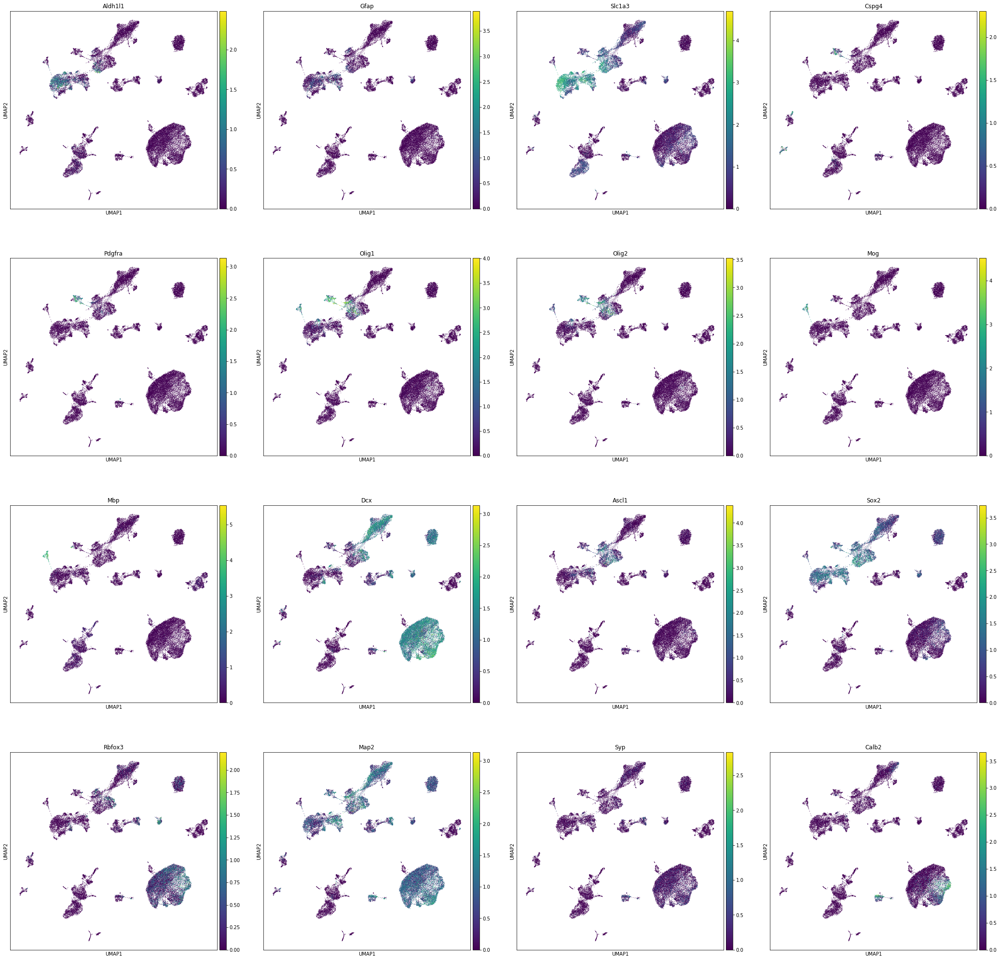

In [11]:
sc.pl.umap(adata, color=['Aldh1l1', 'Gfap', 'Slc1a3', # Astrocyte markers
                         'Cspg4', 'Pdgfra', # NG2 and PDGFRA are NG2-glia markers
                         'Olig1', 'Olig2', 'Mog', 'Mbp', # Oligodendrocyte markers
                         'Ascl1', 'Sox2', # Neural stem/progenitor cells markers
                         'Dcx', # Neuroblast marker
                         'Rbfox3', 'Map2', 'Syp', # Mature neuron markers
                         'Calb2'], # GABAergic neuron marker
           use_raw=True) 

#### 4.2.7 Re-labeling clusters

In [18]:
adata.obs['louvain'].cat.categories

Index(['Neurons-1', 'Neurons-2', 'Neuroblasts-1', 'Astrocytes', 'NPCs',
       'Neurons-3', 'Neuroblasts-2', 'Microglial cells', 'T cells-1',
       'Macrophages', 'Neuroblasts-3', 'Astrocytes_reprogrammed', 'Neurons-4',
       'Dendritic cells-1', 'Endothelial cells', 'Neuroblasts/neurons',
       'Oligodendrocyte precursors', 'Neurons-5', 'Neurons-6',
       'Erothyroblasts?', 'B cells', 'Mural cells', 'Oligodendrocytes',
       'T cells-2', 'Dendritic cells-2'],
      dtype='object')

In [20]:
# Summarize the findings and label the clusters
adata.obs['louvain'].cat.categories = ['WT E18.5 neurons-1', 'WT E18.5 neurons-2', 'Neuroblasts', 
                                       'Astrocytes', 'NPCs', 'WT E18.5 neurons-3', 'WT E18.5 neuroblasts-1', 
                                       'Microglial cells', 'T cells-1', 'Macrophages', 
                                       'WT E18.5 neuroblasts-2', 'Lenti-astrocytes', 'WT E18.5 neurons-4', 
                                       'Dendritic cells-1', 'Endothelial cells', 'WT E18.5 neurons-5', 
                                       'NG2 glia', 'WT E18.5 neurons-6', 'WT E18.5 neurons-7', 
                                       'Hb-expressing cells', 'B cells', 'Mural cells', 'Oligodendrocytes', 
                                       'T cells-2', 'Dendritic cells-2']

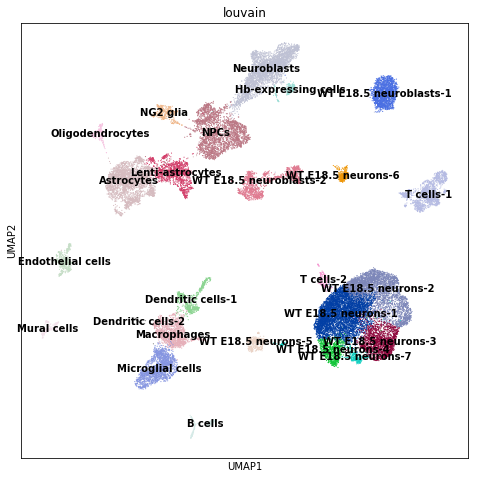

In [21]:
sc.pl.umap(adata, color='louvain', legend_loc='on data', size=5, 
#          save='_AllCells_louvain_annot.pdf'
          )

In [22]:
marker_genes = ['Vwf',  # Endothelial
                'Acta2', # Mural cells
                'C1qa', 'Sparc', # Microglia
                'Adgre1', 'Fcgr1', # Macrophages
                'Ly6c2', 'Ccr2', # Monocyte-derived cells
                'Flt3', # Dendritic cells
                'Cd3e', 'Lat', # T cells
                'Pax5', 'Ms4a1', # B cells
                'Hba-a1', 'Hbb-bs', # Hemoglobin
                'Aldh1l1', 'Gfap', 'Slc1a3', # Astrocyte markers
                'Cspg4', 'Pdgfra', # NG2 and PDGFRA are NG2-glia markers
                'Olig1', 'Olig2', 'Mog', 'Mbp', # Oligodendrocyte markers
                'Ascl1', 'Sox2', # Neural stem/progenitor cells markers
                'Dcx', # Neuroblast marker
                'Rbfox3', 'Map2', 'Syp', # Mature neuron markers
                'Calb2' # GABAergic neuron marker
               ]

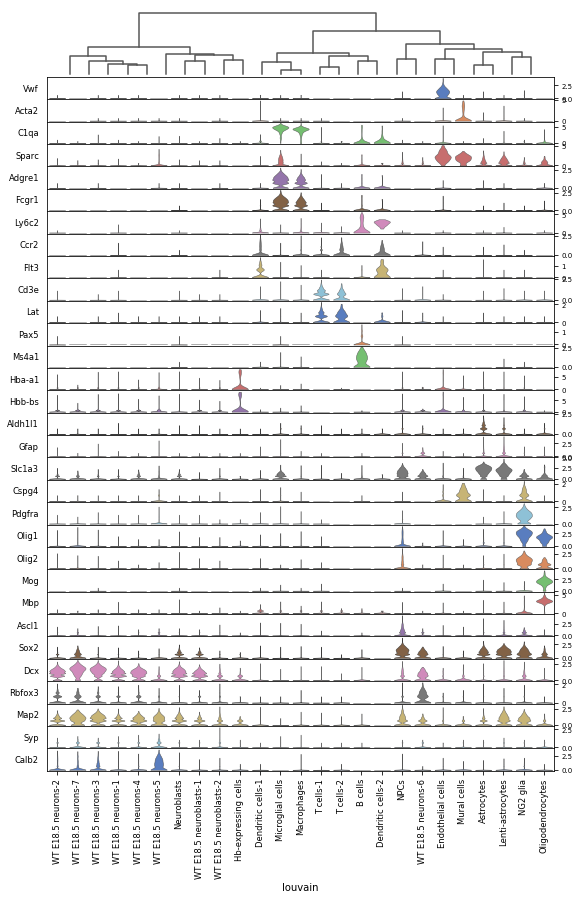

In [23]:
ax = sc.pl.stacked_violin(adata, marker_genes, groupby='louvain', dendrogram=True, swap_axes=True,
#                          var_group_positions= [(0, 0), (2,3)], var_group_labels=['Endothelial', 'Microglial'],
                          figsize=(10, 14), 
                          use_raw=True, 
#                         save='_allCells_marker_panel.pdf' 
                         )

In [24]:
adata.write(data_dir + 'POv2_BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony_PAGA_louvain_annot.h5ad')

### 4.3 Plot signature genes

In [25]:
adata = sc.read(data_dir + 'POv2_BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony_PAGA_louvain_annot.h5ad')

In [26]:
sc.tl.rank_genes_groups(adata, 'louvain', groups='all', reference='rest', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:59)


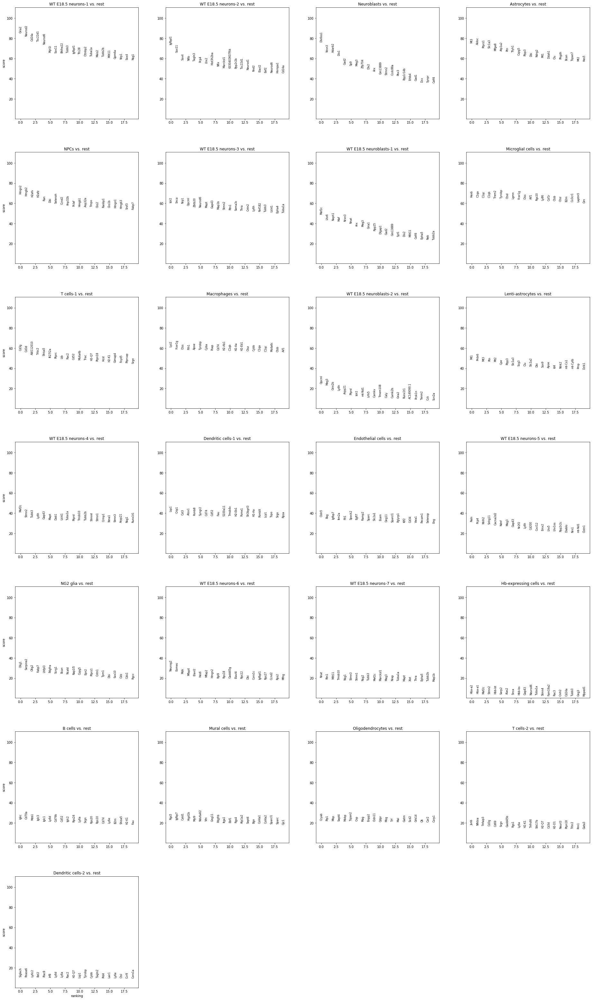

In [27]:
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=True)

### 4.4 BL41 is enriched in neural cells compared to BL42

In [28]:
adata = sc.read(data_dir + 'POv2_BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony_PAGA_louvain_annot.h5ad')

In [36]:
adata.uns['library_name_colors'][1]

'#ff7f0e'

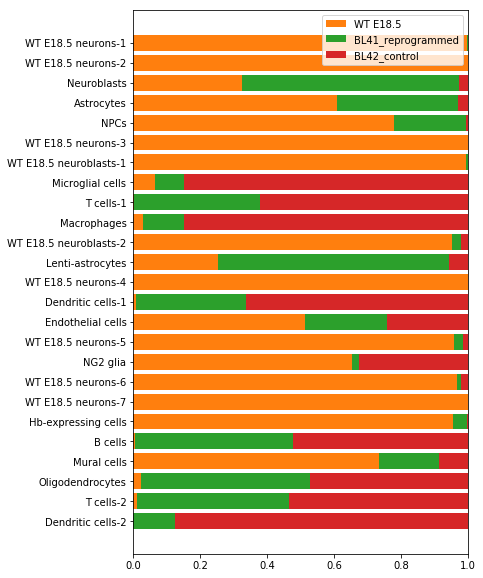

In [37]:
# Plot cell type compoisition of BL41 and BL42
fig, ax = plt.subplots(figsize=(6,10))
N = len(adata.obs['louvain'].cat.categories)

# Sample11_louvain_proportions = (adata.obs[adata.obs['library_name']=='10X_sample11']['louvain'].value_counts(sort=False) / adata.obs['louvain'].value_counts(sort=False))
# Sample51_louvain_proportions = (adata.obs[adata.obs['library_name']=='10X_sample51']['louvain'].value_counts(sort=False) / adata.obs['louvain'].value_counts(sort=False))
WT_proportions = (adata.obs[adata.obs['library_name'].isin(['10X_sample11','10X_sample51'])]['louvain'].value_counts(sort=False) / adata.obs['louvain'].value_counts(sort=False))
BL41_louvain_proportions = (adata.obs[adata.obs['library_name']=='BL41_reprogrammed']['louvain'].value_counts(sort=False) / adata.obs['louvain'].value_counts(sort=False))
BL42_louvain_proportions = (adata.obs[adata.obs['library_name']=='BL42_control']['louvain'].value_counts(sort=False) / adata.obs['louvain'].value_counts(sort=False))

ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence


ax.barh(ind, WT_proportions, align='center', color=adata.uns['library_name_colors'][1])
ax.barh(ind, BL41_louvain_proportions, align='center', 
        left=WT_proportions, color=adata.uns['library_name_colors'][2])
ax.barh(ind, BL42_louvain_proportions, align='center', 
        left=WT_proportions+BL41_louvain_proportions, color=adata.uns['library_name_colors'][3])


ax.set_yticks(ind)
ax.set_yticklabels(adata.obs['louvain'].cat.categories)
ax.invert_yaxis()  # labels read top-to-bottom
# ax.set_xlabel('Performance')
# ax.set_title('How fast do you want to go today?')
plt.legend(('WT E18.5', 'BL41_reprogrammed', 'BL42_control'))

# plt.savefig('./figures/hbar_allCells_louvain_r0.5_cluster_composition.pdf')

plt.show()

# 5 Pseudotime analysis

### 5.1 Removing cell clusters without enrichment for Lenti-DLX2 cells

i.e. Keep clusters Neuroblasts, Astrocytes, NPCs, Lenti-astrocytes, WT E18.5 neurons-5, and Oligodendrocytes for downstream analysis

#### 5.1.1 Create a filter

In [48]:
clusters_include = ['Neuroblasts', 'Astrocytes', 'NPCs', 'Lenti-astrocytes', 'WT E18.5 neurons-5', 'Oligodendrocytes']

In [49]:
index_include = []
for index in adata.obs.index:
    if adata.obs['louvain'][index] in clusters_include: 
        index_include.append(index)

In [51]:
assert len(index_include) == 10523

#### 5.1.2 Subset full dataset

In [54]:
adata_tmp = sc.read(data_dir + 'POv2_BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony.h5ad')

In [55]:
adata_tmp

AnnData object with n_obs × n_vars = 32110 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'pca'
    obsm: 'Harmony', 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [56]:
adata_neural = adata_tmp[index_include,:]

In [57]:
adata_neural.var_names_make_unique()

In [58]:
adata_neural

View of AnnData object with n_obs × n_vars = 10523 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'pca'
    obsm: 'Harmony', 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [59]:
adata_neural.write(neural_data_dir + 'POv2_NeuralOnly_postFiltering_log_pcs50_Harmony.h5ad')

#### 5.1.3 Re-cluster cells with finer resolution 

In [60]:
adata_neural = sc.read(neural_data_dir + 'POv2_NeuralOnly_postFiltering_log_pcs50_Harmony.h5ad')

computing neighbors


/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostic

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:06)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 16 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


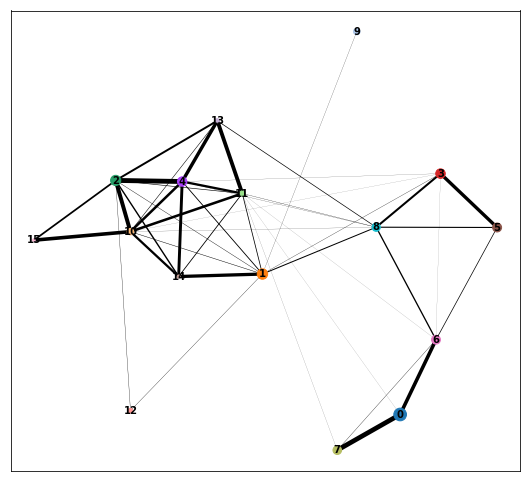

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


In [61]:
sc.pp.neighbors(
    adata_neural,
#    use_rep='X_pca',  
    use_rep='Harmony',  
#    random_state=random_seed
)

sc.tl.louvain(
    adata_neural,
    resolution=1.00,
#    resolution=1.50,
    #    random_state=random_seed
)

sc.tl.paga(
    adata_neural,
    groups='louvain',  
)

sc.pl.paga(
    adata_neural, 
    color=['louvain'], 
    use_raw=True,
#    use_raw=False,
#    layout='fa', 
    layout='fr', 
    threshold=0.01, 
    node_size_scale=0.5,
    node_size_power=0.9, 
#    random_state=random_seed, 
#     save='_AllNeural_PAGA_connectivity.pdf'
)

sc.tl.umap(
    adata_neural,
    init_pos='paga', 
#    random_state=random_seed,
)

#sc.pl.pca_scatter(adata, color='n_counts')
#sc.pl.pca_scatter(adata, color='library_name')
#sc.pl.tsne(adata, color='n_counts')

In [62]:
adata_neural.write(neural_data_dir + 'POv2_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain.h5ad')

In [63]:
adata_neural = sc.read(neural_data_dir + 'POv2_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain.h5ad')

In [65]:
# Make the two WT E18.5 libraries' colors consistent
adata_neural.uns['library_name_colors'][0] = adata_neural.uns['library_name_colors'][1]

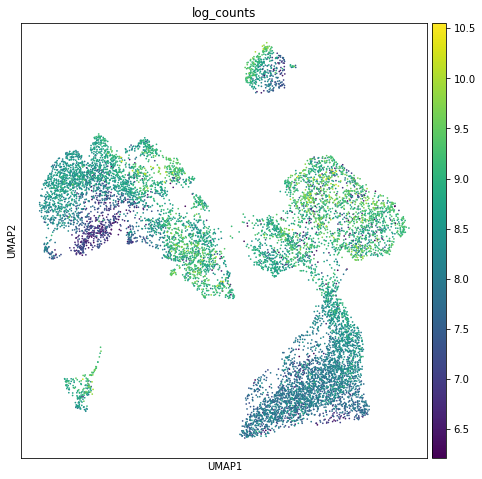

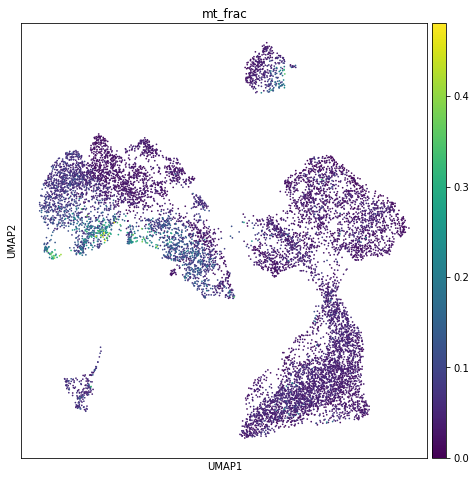

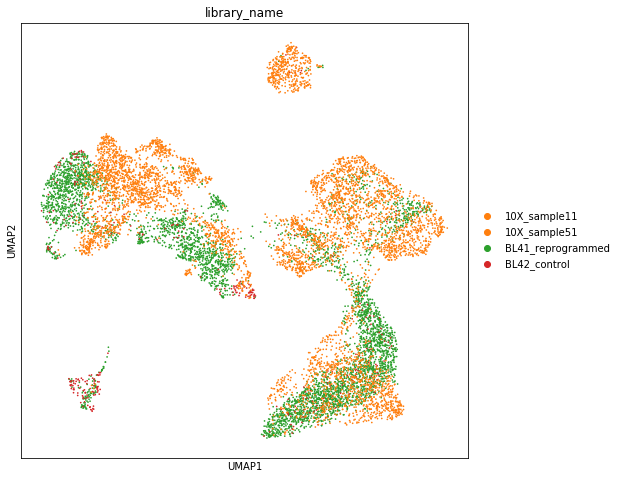

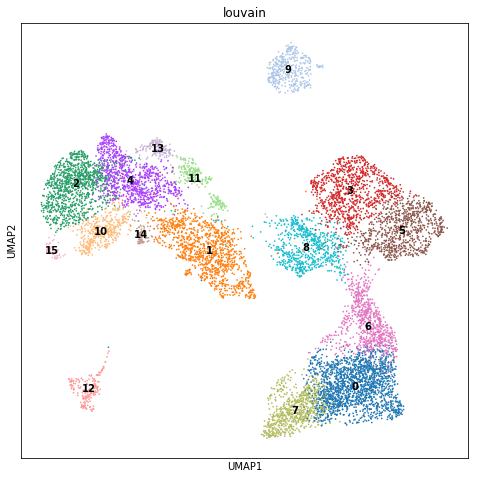

In [66]:
# Visualize sequencing depth, library distribution, and Louvain clusters
sc.pl.umap(adata_neural, color='log_counts', 
#          save='_AllNeural_log_counts.pdf'
          )
sc.pl.umap(adata_neural, color='mt_frac', 
#           save='_AllNeural_mt_frac.pdf'
          )
sc.pl.umap(adata_neural, color='library_name', 
#          save='_AllNeural_library_name.pdf'
          )
sc.pl.umap(adata_neural, color='louvain', legend_loc='on data', 
#          save='_AllNeural_louvain.pdf'
          )

#### 5.1.4 Annotate clusters

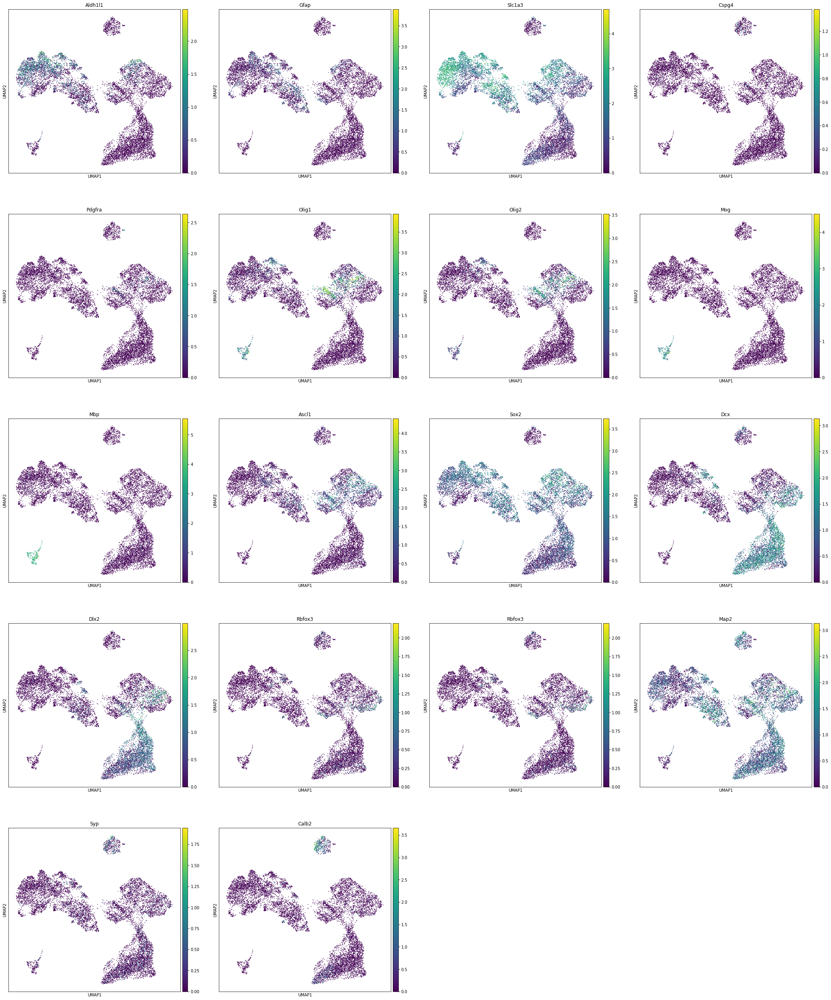

In [68]:
sc.pl.umap(adata_neural, color=['Aldh1l1', 'Gfap', 'Slc1a3', # Astrocyte markers
                         'Cspg4', 'Pdgfra', # NG2 and PDGFRA are NG2-glia markers
                         'Olig1', 'Olig2', 'Mog', 'Mbp', # Oligodendrocyte markers
                         'Ascl1', 'Sox2', # Neural stem/progenitor cells markers
                         'Dcx', 'Dlx2', 'Rbfox3', # Neuroblast marker
                         'Rbfox3', 'Map2', 'Syp', # Mature neuron markers
                         'Calb2'], # GABAergic neuron marker
           use_raw=True) 

In [69]:
adata_neural.obs['louvain'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15'],
      dtype='object')

In [70]:
# Summarizing the findings: 
adata_neural.rename_categories('louvain', ['Mid neuroblasts', 'Lenti-astrocytes', 
                                           'Resident astrocytes', 'Mid NPCs', 
                                           'WT E18.5 astrocytes/qNSCs-1', 
                                           'Late NPCs', 'Early neuroblasts', 
                                           'Late neuroblasts',
                                           'Early NPCs', 'WT E18.5 GABAergic neurons', 
                                           'Dying astrocytes-1', 'WT E18.5 astrocytes/qNSCs-2', 
                                           'Oligodendrocytes', 'WT E18.5 astrocytes/qNSCs-3', 
                                           'Dying astrocytes-2', 'Dying astrocytes-3'])

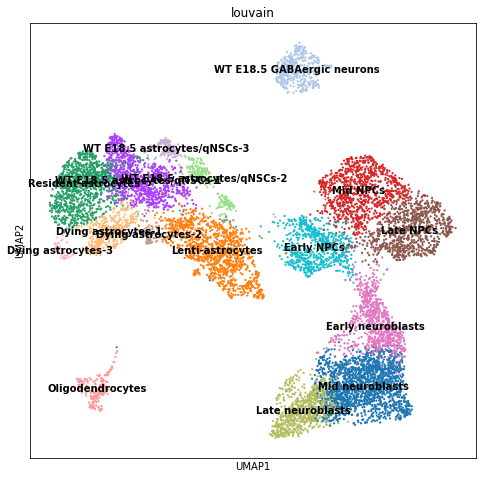

In [72]:
sc.pl.umap(adata_neural, color='louvain', legend_loc='on data', size=20,
#           save='_AllNeural_louvain_annot.pdf'
          )

In [73]:
adata_neural.write(neural_data_dir + 'POv2_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann.h5ad')

### 5.2 Pseudotime analysis

In [74]:
adata_neural = sc.read(neural_data_dir + 'POv2_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann.h5ad')

In [75]:
# Choose a random cell from resident astrocytes as the root of pseudotime
adata_neural.uns['iroot'] = np.flatnonzero(adata_neural.obs['louvain']=='Resident astrocytes')[0]

In [76]:
sc.tl.dpt(adata_neural)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9987807  0.9985125  0.99811906 0.9952151  0.98716843
     0.9792562  0.9768141  0.9758641  0.9730053  0.9673525  0.96410584
     0.96230745 0.95894676 0.9582983 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


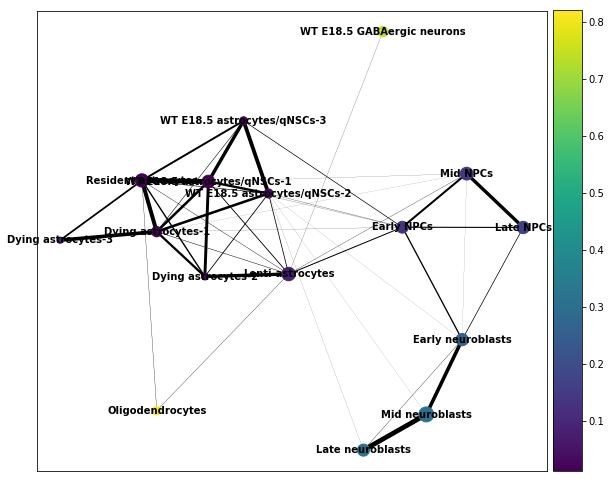

In [78]:
sc.pl.paga(adata_neural, color=['dpt_pseudotime'], use_raw=True)

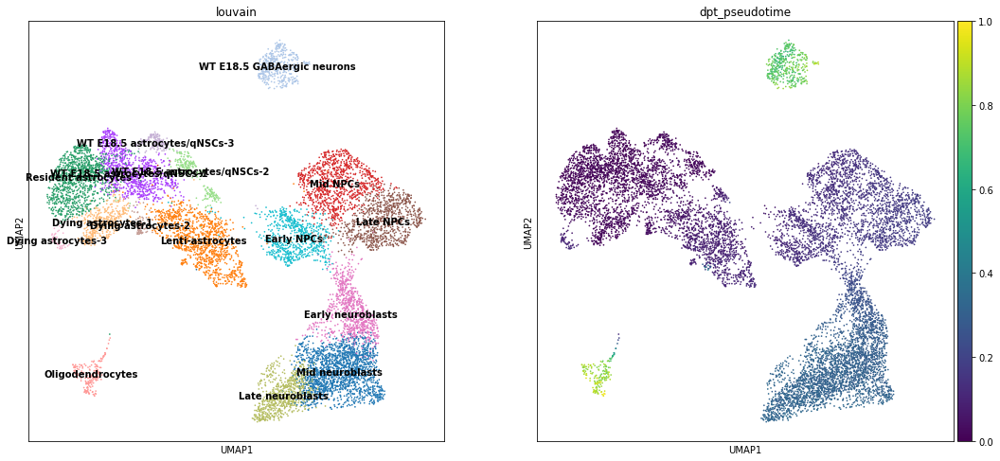

In [77]:
sc.pl.umap(adata_neural, color=['louvain', 'dpt_pseudotime'], legend_loc='on data')

In [79]:
# Calculate order of Louvain clusters based on their median pseudotime
pseudotime_median = []
for cluster in adata_neural.obs['louvain'].cat.categories:
    pseudotime_median.append(adata_neural.obs['dpt_pseudotime'][adata_neural.obs['louvain']==cluster].median())

data = {'clusters': adata_neural.obs['louvain'].cat.categories, 'pseudotime_median': pseudotime_median}

pd_pseudotime = pd.DataFrame(data=data)

pd_pseudotime.sort_values(by='pseudotime_median', inplace=True)

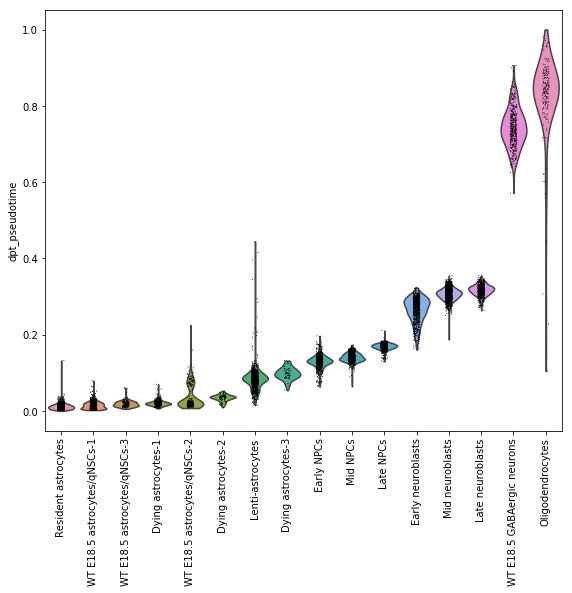

In [80]:
# Plot pseudotime in each cluster
sc.pl.violin(adata_neural, 'dpt_pseudotime', groupby='louvain', use_raw=True, rotation=90, order=pd_pseudotime['clusters'])

This ordering is consistent with the cluster labels, and suggests that the reprogrammed cells goes as follows:
1. Resident astrocytes
2. Lenti-astrocytes
3. NPCs (early->mid->late)
4. Neuroblasts (early->mid->late)

Notes:
* WT E18.5 astrocytes/qNSCs seem to be in a cell state between astrocytes and lenti-astrocytes, consistent with the fact that they should be actively developing
* Dying astrocyte clusters should be removed from further analysis
* WT E18.5 GABAergic neurons and oligodendrocytes have a jump in pseudotime compared to neuroblasts, probably because they are much more mature cell types. It seems that we haven't captured the intermediate states between NPCs and oligodendrocytes, and between neuroblasts and mature GABAergic neurons. To avoid making forced connections, we will remove WT E18.5 GABAergic neurons and oligodendrocytes from downstream analyses. 

### 5.3 Remove WT E18.5 neurons and oligodendrocytes

#### 5.3.1 Remove Oligodendrocytes and Public neurons

In [81]:
include = [not isin for isin in adata_neural.obs['louvain'].isin(['WT E18.5 GABAergic neurons', 'Oligodendrocytes'])]

In [82]:
adata_neural = adata_neural[include]

In [83]:
adata_neural

View of AnnData object with n_obs × n_vars = 9928 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'pca', 'umap', 'iroot', 'diffmap_evals'
    obsm: 'Harmony', 'X_pca', 'X_umap', 'X_diffmap'
    varm: 'PCs'
    layers: 'counts'

#### 5.3.2 Calculate pseudotime ranking

In [84]:
# Rank cells based on their pseudotime
array = np.array(adata_neural.obs['dpt_pseudotime'])

temp = array.argsort()

ranks = np.empty_like(temp)

ranks[temp] = np.arange(len(array))

In [85]:
adata_neural.obs['rank_pseudotime'] = ranks

Trying to set attribute `.obs` of view, making a copy.


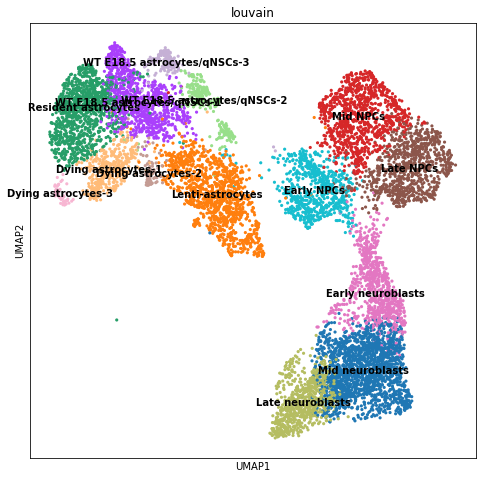

In [88]:
sc.pl.umap(adata_neural, color=['louvain'], size=40, legend_loc='on data')

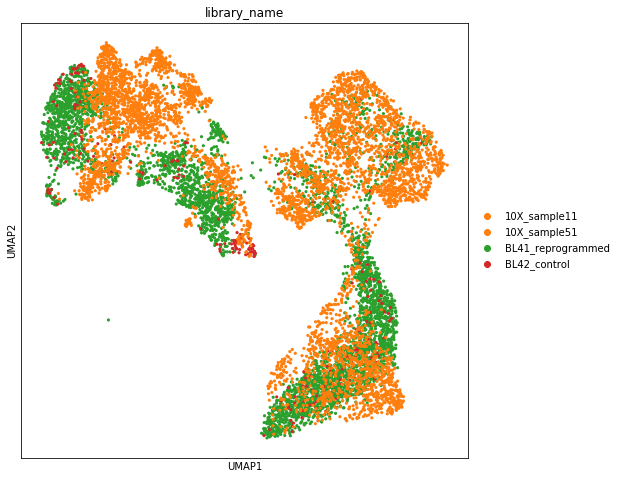

In [89]:
sc.pl.umap(adata_neural, color=['library_name'], size=40, 
#           save='_MT_library_.pdf'
          )

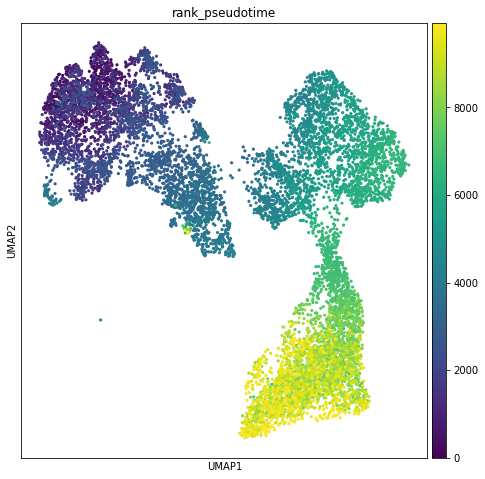

In [90]:
sc.pl.umap(adata_neural, color=['rank_pseudotime'], legend_loc='on data', size=40,
#          save='_MT_rank_pseudotime.pdf'
          )

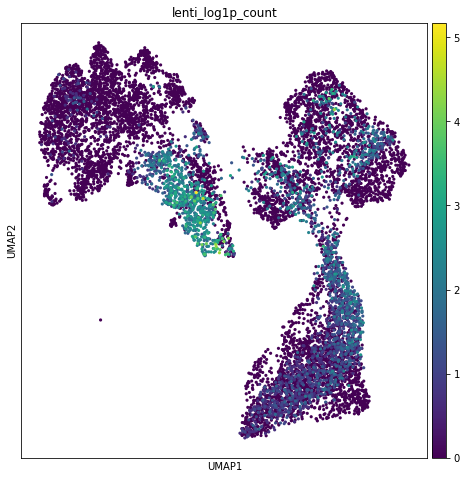

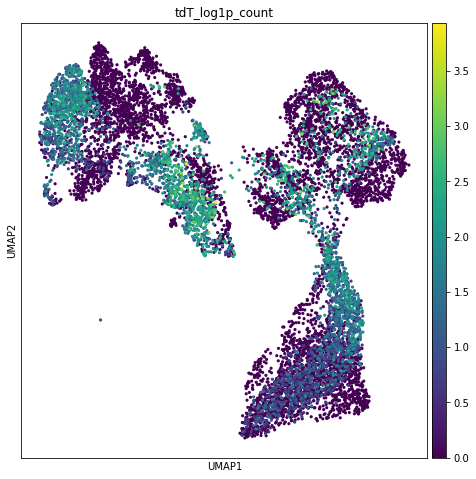

In [91]:
# Visualize lentivirus and tdT expression levels
sc.pl.umap(adata_neural, color='lenti_log1p_count', size=40,
#          save='_AllNeural_lenti_log1p_count.pdf'
          )
sc.pl.umap(adata_neural, color='tdT_log1p_count', size=40,
#          save='_AllNeural_tdT_log1p_count.pdf'
          )

In [92]:
adata_neural.write(neural_data_dir + 'POv2_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann_rankPseudotime.h5ad')

### 5.4 Examine known adult neurogenesis genes in dataset

In [93]:
adata_neural = sc.read(neural_data_dir + 'POv2_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann_rankPseudotime.h5ad')

#### 5.4.1 Markers from Dulken et al., 2017

In [95]:
# Rpl32 and Egfr have to be manually added to .obs. Otherwise, scanpy doesn't plot them correctly. 
for gene in ['Rpl32', 'Egfr']:

    adata_neural.obs[gene] = adata_neural.raw[:,gene].X

/home2/s418610/.conda/envs/py37_TOC_PAGA/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


In [98]:
# Split dataset based on their origin
adata_10X = adata_neural[adata_neural.obs['batch']=='10X']

adata_experiment = adata_neural[adata_neural.obs['batch']=='experiment']

adata_DLX2 = adata_neural[adata_neural.obs['library_name']=='BL41_reprogrammed']

In [99]:
genes_to_plot = ['Id3', 'Clu', 'Rpl32', 'Egfr', 'Cdk1', 'Ccna2', 'Mki67', 'Dlx1', 'Dlx2', 'Dcx', 'Dlx6os1']

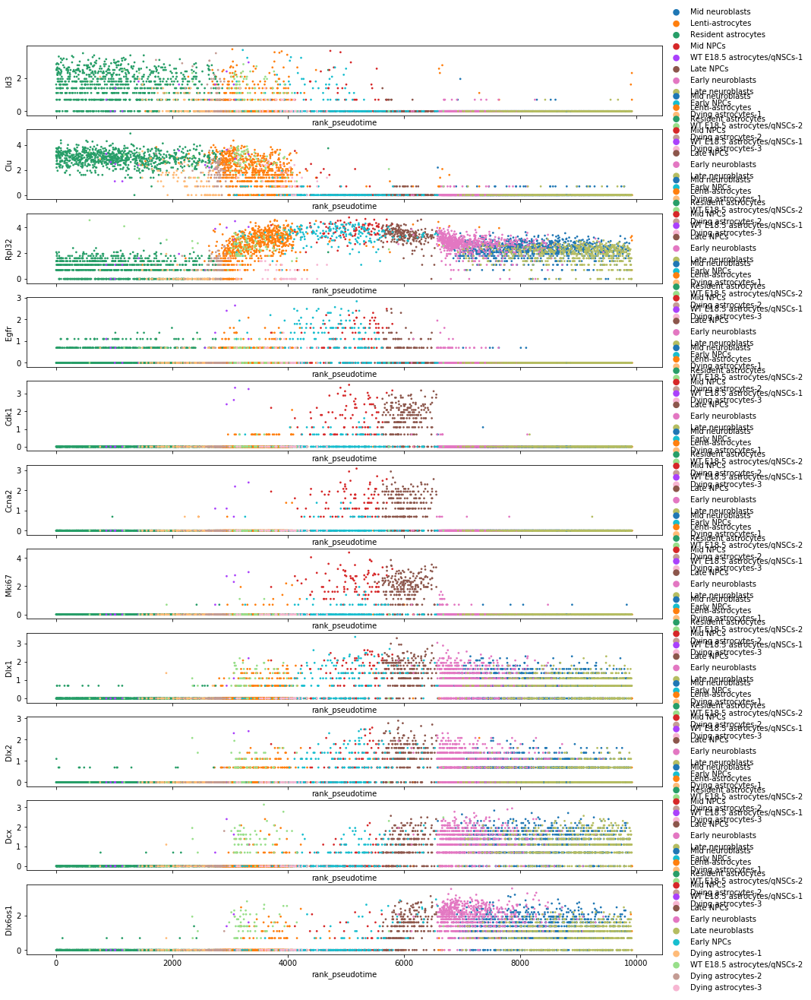

In [100]:
# Plot these genes in lenti-DLX2 cells
# Figure 3D
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_DLX2, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
# plt.savefig('./figures/scatter_Dulken_markers_pseudotime_BL41lOnly.pdf')

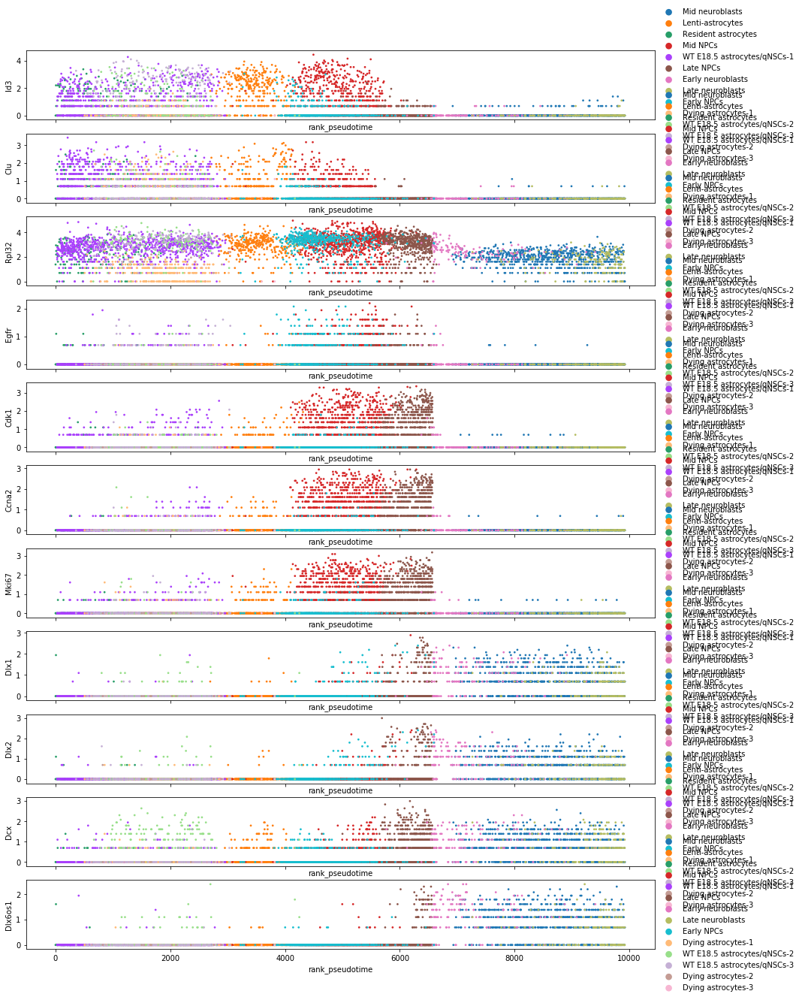

In [101]:
# Plot these genes WT E18.5 cells
# Figure S4A
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_10X, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
# plt.savefig('./figures/scatter_Dulken_markers_pseudotime_10XOnly.pdf')

#### 5.4.2 Markers from Shin et al., 2015

In [102]:
genes_to_plot = ['Gfap', 'Apoe', 'Aldoc', 'Hopx',# qNSC
                 'Sox11', 'Eomes', 'Stmn1' # aNSC
                 ]

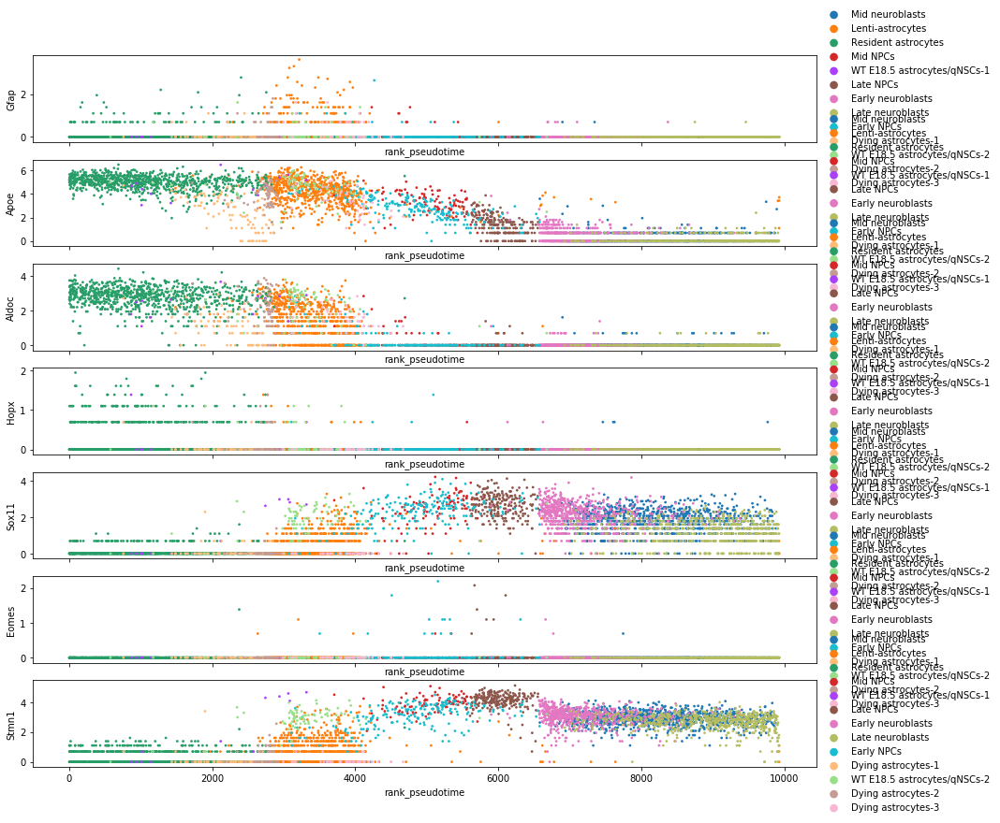

In [103]:
# Plot these genes in lenti-DLX2 cells
# Figure S4B
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_DLX2, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
# plt.savefig('./figures/scatter_Shin_markers_pseudotime_BL41lOnly.pdf')

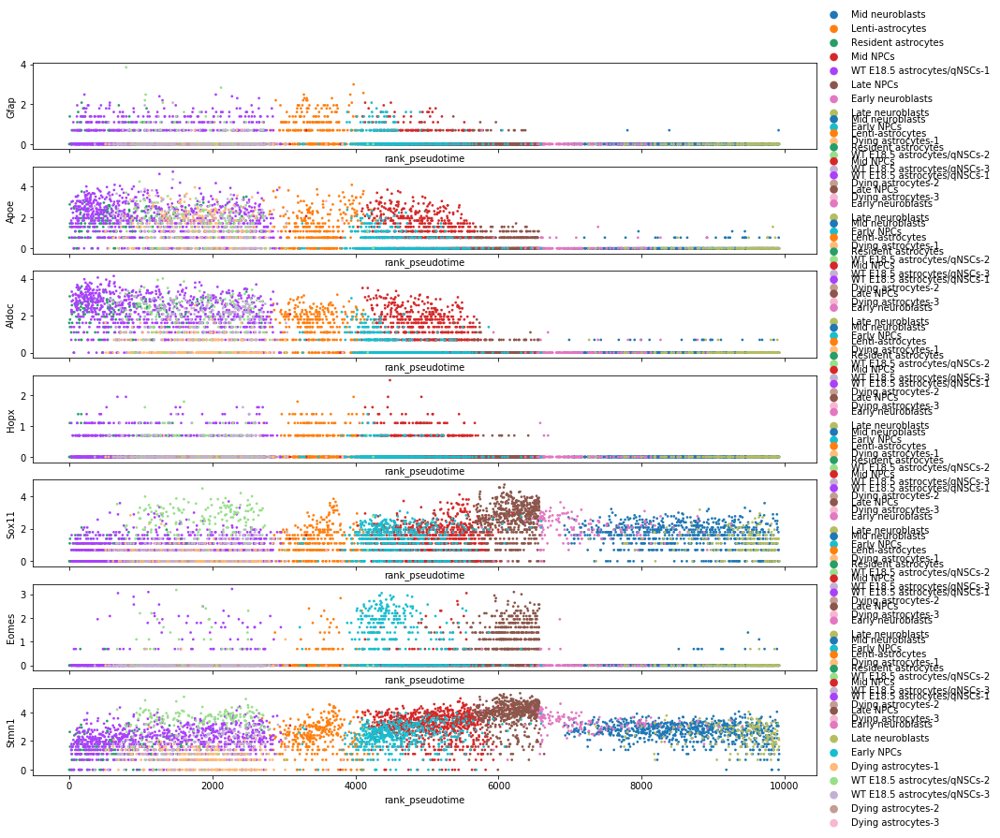

In [104]:
# Plot these genes in WT E18.5 cells
# Figure S4C
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_10X, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
# plt.savefig('./figures/scatter_Shin_markers_pseudotime_10XOnly.pdf')

#### 5.4.3 Other marker genes

In [105]:
genes_to_plot = ['Gfap', 'Ascl1', 'Dcx', 'Cdk1', 'Mki67', 'Calb2']

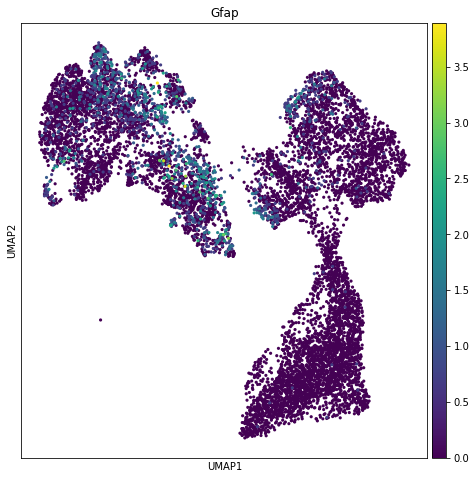

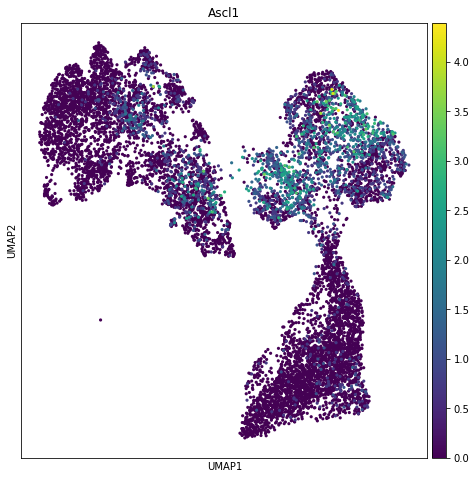

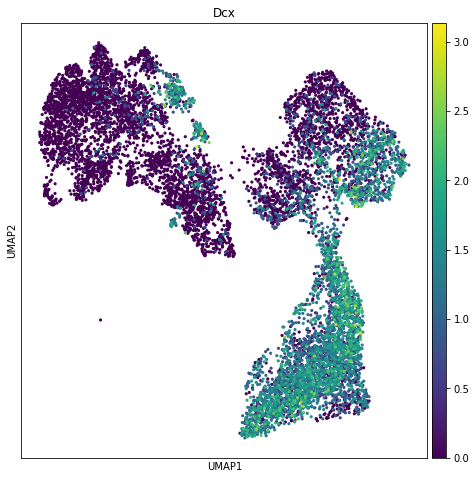

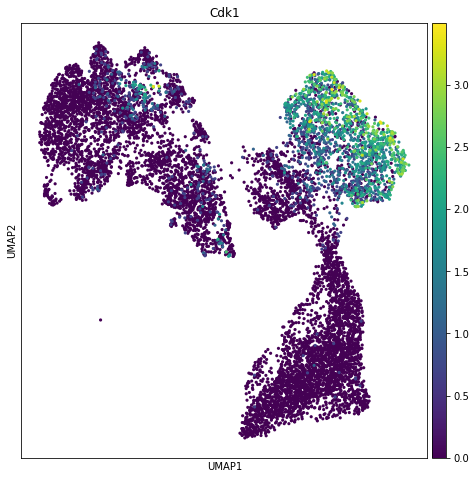

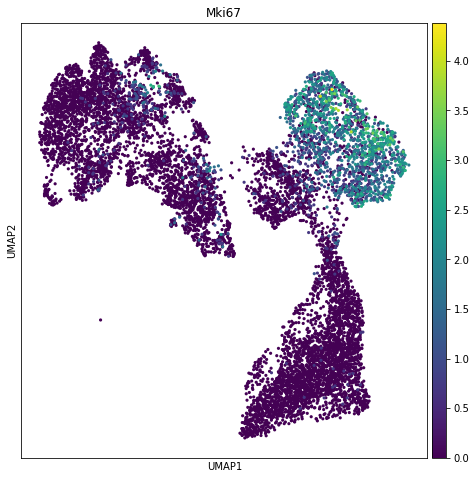

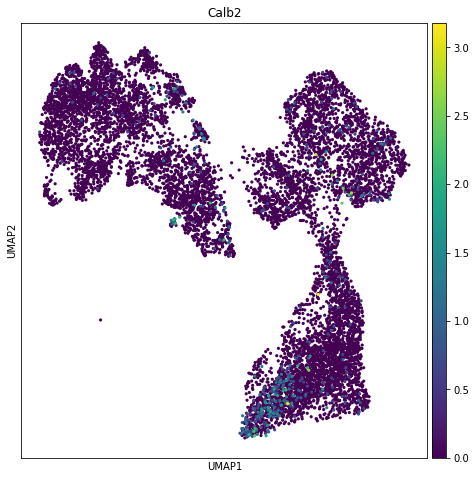

In [106]:
# Figure S3DEFGH
for gene in genes_to_plot:
    sc.pl.umap(adata_neural, color=gene, legend_loc='on data', size=40, use_raw=True, 
#              save='_MT_'+gene+'.pdf'
              )